### Preamble ###

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mc
from matplotlib.pyplot import cm 

from matplotlib.patches import Circle
import matplotlib.patches as patches

from arepy.read_write import binary_read as rsnap
from arepy.read_write import binary_write as wsnap
from arepy.utility import cgs_constants as cgs
from arepy.utility import snap_utility as sutil

#NEW utils functions! 
import arepy.utils as utils

from scipy.interpolate import NearestNDInterpolator
from numpy import uint32, uint64, float64, float32
import math

from scipy import signal
from scipy import ndimage

import pandas as pd

import pickle

########### GENERAL STUFF  ##########

#internal arepo units in cgs
ulength = 3.0856e20
umass = 1.991e33
uvel = 1.0e5

utime = ulength/uvel
udensity = umass/ulength/ulength/ulength
uenergy= umass*uvel*uvel
ucolumn = umass/ulength/ulength
umag = umass**0.5 / ulength**1.5 * uvel

uMyr=utime/(60.*60.*24.*365.25*1.e6)

uparsec=ulength/3.0856e18

### Save Plots Switch ###

In [2]:
save_plots = False

if save_plots == True:
    save_base = '/cosma8/data/dp058/dc-bogu1/Paper_2_Plots/'

### Load All Grids Switch ###

In [3]:
#loading all the grids takes a long time, so this isn't always necessary
load_all_grids = False

### Define Kwargs ###

In [4]:
# key word arguments

kwargs = {
    # center 
    'center':[500,500,500],

    # cutting data to disc
    'cut_R_inner':0 ,
    'cut_R_outer':100, #for code unit 100pc, 100 here = 10kpc
    'cut_z':5,
    
    #NL97
    'xHe':0.1,
    'mp':1.6726231e-24,
    'kb':1.3806485e-16,

    #star fomration efficiency
    'SFE':0.05}   #CHANGE SFE FROM 5% to 10% IF YOU'RE LOOKING AT SMALLER SINKS!!!! 


#xHe=0.1, mp = 1.6726231e-24, kb = 1.3806485e-16,

### Functions (move to utils) ###

In [5]:
def load_hro_results(species, grid_base):
    with open(f'{grid_base}{species}_hro_grid_outputs.pkl', 'rb') as f:
        outputs_dict = pickle.load(f)
    print('HRO results loaded')
    return outputs_dict

### Set bases for data load-in ###

In [6]:
########## set path of snapshot data and snap number ##########

#snap_base = '/cosma7/data/dp058/dc-bogu1/UPDATED_BRANCH/MHD_SIMS/NEW_SINKS_NO_T/snapshots/'
#snap_base = '/cosma8/data/dp058/dc-bogu1/MHD_SIMS/HIGHER_RES_SINK_ACC_STOP/snapshots/'

snap_base = '/cosma8/data/dp058/dc-bogu1/MHD_SIMS/JEANS_ON_FIX/JEANS_FIX_2pc/snapshots/'

number = 189
#number = 205
#number = 244

filenum=str(number).zfill(3)

########## set path of equivalent grid data ##########

#grid_base = '/cosma8/data/dp058/dc-bogu1/MHD_SIMS/GRID_TILE_MAKER/FIRST_TEST/'

#grid_base = '/cosma8/data/dp058/dc-bogu1/MHD_SIMS/GRID_TILE_MAKER/2pc_100Myr/'
#grid_base = '/cosma8/data/dp058/dc-bogu1/MHD_SIMS/GRID_TILE_MAKER/HR_100Myr/'

#grid_base = '/cosma8/data/dp058/dc-bogu1/MHD_SIMS/GRID_TILE_MAKER/2pc_120Myr/'
#grid_base = '/cosma8/data/dp058/dc-bogu1/MHD_SIMS/GRID_TILE_MAKER/HR_120Myr/'

grid_base = '/cosma8/data/dp058/dc-bogu1/MHD_SIMS/GRID_TILE_MAKER/JEANS_FIX_90Myr/'

### Set tile parameters for chosen single tile ###

In [7]:
#set coordinates for selected tile (in kpc)
tile_x = [-3,-1]
tile_y = [-3,-1]
cut_z = [-0.5,0.5] 

grid_origin_coords = str(tile_x[0]) + '_' + str(tile_y[0])

#define tile parameters
tile_xy_size = 20 #in code units, i.e tile_xy_size=25 means 25 * 100 pc = 2500pc (2.5kpc)
tile_z_size = 10
tile_volume = (tile_xy_size**2) * tile_z_size

# Data Load In #

### Load single grids for single tile plotting ###

In [8]:
dens_grid = rsnap.read_grid(grid_base + 'tile_grids/density_grid_' + grid_origin_coords)

rho_cgs_grid = dens_grid * udensity    #convert to cgs units
xHe=0.1
mp = 1.6726231e-24
yn_grid = rho_cgs_grid/((1. + 4.0 * xHe) * mp)  #this is the number density grid

xHp_grid = rsnap.read_grid(grid_base + 'tile_grids/xHP_grid_' + grid_origin_coords)
Hp_grid = yn_grid * xHp_grid

xH2_grid = rsnap.read_grid(grid_base + 'tile_grids/xH2_grid_' + grid_origin_coords)
H2_grid = yn_grid * xH2_grid

xHI_grid = 1 - xHp_grid - 2*xH2_grid
HI_grid = yn_grid * xHI_grid

magnetic_grid = rsnap.read_vector_grid(grid_base + 'tile_grids/magnetic_grid_' + grid_origin_coords)

Loading file /cosma8/data/dp058/dc-bogu1/MHD_SIMS/GRID_TILE_MAKER/JEANS_FIX_90Myr/tile_grids/density_grid_-3_-3
[1000] [1000] [1000]
1000
Loading file /cosma8/data/dp058/dc-bogu1/MHD_SIMS/GRID_TILE_MAKER/JEANS_FIX_90Myr/tile_grids/xHP_grid_-3_-3
[1000] [1000] [1000]
1000
Loading file /cosma8/data/dp058/dc-bogu1/MHD_SIMS/GRID_TILE_MAKER/JEANS_FIX_90Myr/tile_grids/xH2_grid_-3_-3
[1000] [1000] [1000]
1000
Loading file /cosma8/data/dp058/dc-bogu1/MHD_SIMS/GRID_TILE_MAKER/JEANS_FIX_90Myr/tile_grids/magnetic_grid_-3_-3
[1000] [1000] [1000]
1000


### Load whole snapshot projections ###

In [9]:
Ndensity, B_field, SSx, SSy, time, xHp_proj, xH2_proj, NH = utils.load_proj_data(snap_base, filenum, xHe=0.1, read_snap=True)

Loading file /cosma8/data/dp058/dc-bogu1/MHD_SIMS/JEANS_ON_FIX/JEANS_FIX_2pc/snapshots/density_proj_189
1000 1000
Loading file /cosma8/data/dp058/dc-bogu1/MHD_SIMS/JEANS_ON_FIX/JEANS_FIX_2pc/snapshots/xHP_proj_189
1000 1000
Loading file /cosma8/data/dp058/dc-bogu1/MHD_SIMS/JEANS_ON_FIX/JEANS_FIX_2pc/snapshots/xH2_proj_189
1000 1000
Loading file /cosma8/data/dp058/dc-bogu1/MHD_SIMS/JEANS_ON_FIX/JEANS_FIX_2pc/snapshots/magnetic_proj_189


### Load all grid HRO results ###

In [10]:
total_outputs_dict = load_hro_results('total_gas', grid_base)
print('Loaded total')

Hp_outputs_dict = load_hro_results('Hp', grid_base)
print('Loaded Hp')
    
H2_outputs_dict = load_hro_results('H2', grid_base)
print('Loaded H2')
    
HI_outputs_dict = load_hro_results('HI', grid_base)
print('Loaded HI')

HRO results loaded
Loaded total
HRO results loaded
Loaded Hp
HRO results loaded
Loaded H2
HRO results loaded
Loaded HI


In [11]:
total_outputs_dict.keys()

dict_keys(['Total_hros', 'Total_bin_edges', 'Total_cdens', 'Total_xi', 'Total_cosphi', 'Total_bin_pop'])

In [12]:
Hp_outputs_dict.keys()

dict_keys(['Hp_hros', 'Hp_bin_edges', 'Hp_cdens', 'Hp_xi', 'Hp_cosphi', 'Hp_bin_pop'])

In [13]:
H2_outputs_dict.keys()

dict_keys(['H2_hros', 'H2_bin_edges', 'H2_cdens', 'H2_xi', 'H2_cosphi', 'H2_bin_pop'])

In [14]:
HI_outputs_dict.keys()

dict_keys(['HI_hros', 'HI_bin_edges', 'HI_cdens', 'HI_xi', 'HI_cosphi', 'HI_bin_pop'])

# Catalogue Creation #

### Compute Key Parameters For Catalogue and Scatter Plots ####

In [15]:
########## loading data and defining tiles ########## 

filenum = str(number).zfill(3)

#load data with my function
snap_data = utils.load_snap_data(base=snap_base, filenum=filenum, **kwargs)

# Define the list of tile_params for the different regions, by defining the range and step in kpc
tiles_min_xy = -5
tiles_max_xy = 5
tile_size_xy = 2

x_ranges = [[tiles_min_xy + i*tile_size_xy, tiles_min_xy + (i+1)*tile_size_xy] for i in range(int((tiles_max_xy-tiles_min_xy)/tile_size_xy))]
y_ranges = [[tiles_min_xy + i*tile_size_xy, tiles_min_xy + (i+1)*tile_size_xy] for i in range(int((tiles_max_xy-tiles_min_xy)/tile_size_xy))]
z_ranges = [[-0.5, 0.5]]  # Constant z coordinates

# Generate tile_params
tile_params_list = [(x, y, z) for x in x_ranges for y in y_ranges for z in z_ranges]
#print(tile_params_list)

loading data from; /cosma8/data/dp058/dc-bogu1/MHD_SIMS/JEANS_ON_FIX/JEANS_FIX_2pc/snapshots/snap_189.hdf5
using xHe =  0.1


In [16]:
########## copute key parameters for all regions and store results ########## 

# Create an empty list to store the results
results_list = []

# Loop over each set of tile_params and call the function
for i, tile_params in enumerate(tile_params_list, start=1):
    # Call the function for each region
    result = utils.compute_parameters_for_region(snap_base, number, snap_data, tile_params, **kwargs)
    # Append the result to the list of results
    results_list.append(result)
    #print iteration to know progress of loop
    print(i)

/cosma8/data/dp058/dc-bogu1/MHD_SIMS/JEANS_ON_FIX/JEANS_FIX_2pc/snapshots/snap_189.hdf5
1
/cosma8/data/dp058/dc-bogu1/MHD_SIMS/JEANS_ON_FIX/JEANS_FIX_2pc/snapshots/snap_189.hdf5
2
/cosma8/data/dp058/dc-bogu1/MHD_SIMS/JEANS_ON_FIX/JEANS_FIX_2pc/snapshots/snap_189.hdf5
3
/cosma8/data/dp058/dc-bogu1/MHD_SIMS/JEANS_ON_FIX/JEANS_FIX_2pc/snapshots/snap_189.hdf5
4
/cosma8/data/dp058/dc-bogu1/MHD_SIMS/JEANS_ON_FIX/JEANS_FIX_2pc/snapshots/snap_189.hdf5
5
/cosma8/data/dp058/dc-bogu1/MHD_SIMS/JEANS_ON_FIX/JEANS_FIX_2pc/snapshots/snap_189.hdf5
6
/cosma8/data/dp058/dc-bogu1/MHD_SIMS/JEANS_ON_FIX/JEANS_FIX_2pc/snapshots/snap_189.hdf5
7
/cosma8/data/dp058/dc-bogu1/MHD_SIMS/JEANS_ON_FIX/JEANS_FIX_2pc/snapshots/snap_189.hdf5
8
/cosma8/data/dp058/dc-bogu1/MHD_SIMS/JEANS_ON_FIX/JEANS_FIX_2pc/snapshots/snap_189.hdf5
9
/cosma8/data/dp058/dc-bogu1/MHD_SIMS/JEANS_ON_FIX/JEANS_FIX_2pc/snapshots/snap_189.hdf5
10
/cosma8/data/dp058/dc-bogu1/MHD_SIMS/JEANS_ON_FIX/JEANS_FIX_2pc/snapshots/snap_189.hdf5
11
/cosma8/

In [17]:
########## create catalogue with key parameters ########## 

# Define the column names for the DataFrame
column_names = [
    'Bottom-Left Coordinate [$kpc$]',
    'Total Volume Density [$gcm^{-3}$]',
    'Median Volume Density [$gcm^{-3}$]',
    'Median Magnetic Field Strength [$\mu G$]',
    'Median Temperature [$K$]',
    'Total Gas Surface Density [$M_\odot pc^{-2}$]',
    'Median Gas Surface Density [$M_\odot pc^{-2}$]',
    'Median SFR Surface Density [$M_\odot yr^{-1} kpc^{-2}$]'
]

# Create the DataFrame from the list of results
catalogue_df = pd.DataFrame(results_list, columns=column_names)

In [18]:
########## add HRO results for all species ########## 

# Function to add columns and assign values
def add_xi_columns(df, data_dict, gas_type):
    column_names = [
        f'HRO Xi 1 - 10 ({gas_type})',
        f'HRO Xi 10 - 100 ({gas_type})',
        f'HRO Xi 100 - 800 ({gas_type})'
    ]
    for col in column_names:
        df[col] = np.nan

    for i, values in enumerate(data_dict[f'{gas_type}_xi']):
        if i < len(df):
            df.at[i, column_names[0]] = values[0]
            df.at[i, column_names[1]] = values[1]
            df.at[i, column_names[2]] = values[2]

# Add columns and assign values for each gas type
add_xi_columns(catalogue_df, total_outputs_dict, 'Total')
add_xi_columns(catalogue_df, Hp_outputs_dict, 'Hp')
add_xi_columns(catalogue_df, H2_outputs_dict, 'H2')
add_xi_columns(catalogue_df, HI_outputs_dict, 'HI')

In [19]:
# Display the updated DataFrame
catalogue_df

,Bottom-Left Coordinate [$kpc$],Total Volume Density [$gcm^{-3}$],Median Volume Density [$gcm^{-3}$],Median Magnetic Field Strength [$\mu G$],Median Temperature [$K$],Total Gas Surface Density [$M_\odot pc^{-2}$],Median Gas Surface Density [$M_\odot pc^{-2}$],Median SFR Surface Density [$M_\odot yr^{-1} kpc^{-2}$],HRO Xi 1 - 10 (Total),HRO Xi 10 - 100 (Total),HRO Xi 100 - 800 (Total),HRO Xi 1 - 10 (Hp),HRO Xi 10 - 100 (Hp),HRO Xi 100 - 800 (Hp),HRO Xi 1 - 10 (H2),HRO Xi 10 - 100 (H2),HRO Xi 100 - 800 (H2),HRO Xi 1 - 10 (HI),HRO Xi 10 - 100 (HI),HRO Xi 100 - 800 (HI)
0,"(-5, -5)",1.803023e-25,1.952997e-25,0.023109,7624.914442,2.660412,2.694928,0.000000,0.193603,0.138857,0.290598,NaN,NaN,NaN,-0.256988,-0.439175,-0.200000,0.194886,0.365443,0.708333
1,"(-5, -3)",5.476446e-25,6.862427e-23,4.153341,65.866656,8.080652,6.662178,0.000000,0.269094,0.166168,0.028538,-0.880597,NaN,NaN,-0.058601,-0.161242,-0.057600,0.280115,0.239625,0.203835
2,"(-5, -1)",6.073620e-25,2.187612e-22,8.649555,36.414257,8.961800,5.669970,0.000000,0.337970,0.240103,0.076834,0.200000,NaN,NaN,-0.004499,-0.125216,-0.023841,0.354968,0.321471,0.228930
3,"(-5, 1)",4.629210e-25,2.487650e-23,0.929558,131.560690,6.830532,6.183083,0.000000,0.245496,0.390112,0.065713,NaN,NaN,NaN,0.159824,-0.143053,-0.228849,0.255695,0.437409,0.314580
4,"(-5, 3)",2.185696e-25,1.914256e-25,0.029811,7533.022435,3.225057,3.032279,0.000000,0.124200,0.064136,-0.286957,NaN,NaN,NaN,-0.376485,-0.695455,-0.333333,0.126508,0.208221,-0.589744
5,"(-3, -5)",5.084726e-25,1.310370e-23,0.586653,206.445445,7.502659,5.629082,0.000000,0.272140,0.221468,0.069284,NaN,NaN,NaN,-0.046610,-0.201705,-0.237469,0.282513,0.292305,0.401903
6,"(-3, -3)",1.228123e-24,2.817980e-22,16.453091,35.633735,18.121308,17.969913,0.013867,0.406496,0.311260,0.158484,0.372014,NaN,NaN,0.216714,0.142313,0.259063,0.420507,0.353953,0.156417
7,"(-3, -1)",2.315719e-24,4.482290e-22,45.913426,41.341403,34.169100,28.344136,0.069840,0.488454,0.421488,0.334539,0.138679,NaN,NaN,0.451427,0.346485,0.379472,0.468276,0.393687,0.259976
8,"(-3, 1)",1.402107e-24,3.605494e-22,22.042930,37.830701,20.688484,16.136679,0.005286,0.388970,0.280078,0.229292,0.363265,NaN,NaN,0.156567,0.138871,0.285288,0.410892,0.332277,0.336320
9,"(-3, 3)",4.982004e-25,4.422486e-24,0.219224,541.759679,7.351089,7.127023,0.000000,0.249231,0.218412,-0.149304,0.250000,NaN,NaN,-0.048416,-0.169851,-0.234109,0.258283,0.286994,0.109563


# Plot Generation #

### Single Tile Side-By-Side Grids ###

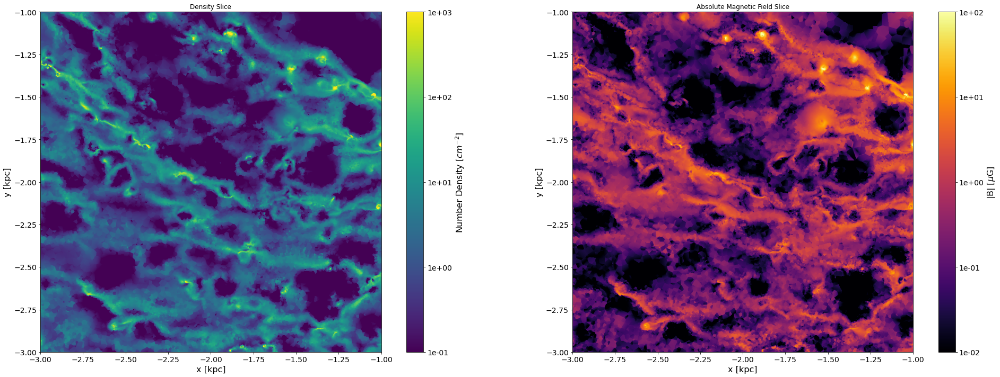

In [20]:
########## image slices of density and magnetic grid fed into HRO ########## 

# Define the slice index you want to visualize
slice_index = 500

# Define the grid dimensions
x_dim, y_dim, z_dim = dens_grid.shape

# Convert magnetic field components to microgauss strength
B_field_abs = np.sqrt(magnetic_grid[:,:,slice_index,0]**2 + magnetic_grid[:,:,slice_index,1]**2 + magnetic_grid[:,:,slice_index,2]**2)
B_abs_microgauss = B_field_abs * umag * 1e6

# Plotting settings
extent = (tile_x[0], tile_x[1], tile_y[0], tile_y[1])
levels_dens = np.logspace(-1, 3, 256)
levels_mag = np.logspace(-2, 2, 256)
norm_dens = mc.BoundaryNorm(levels_dens, 256)
norm_mag = mc.BoundaryNorm(levels_mag, 256)

# Set images size
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 28
fig_size[1]= 10
plt.rcParams["figure.figsize"] = fig_size

# Create the subplots
fig, axes = plt.subplots(1, 2)

# Plot the first subplot (Density Slice)
axes[0].imshow(yn_grid[:, :, slice_index].T, origin='lower', norm=norm_dens, cmap='viridis', extent=extent)
axes[0].set_title('Density Slice')
axes[0].set_xlabel('x [kpc]', fontsize=16)
axes[0].set_ylabel('y [kpc]', fontsize=16)
axes[0].set_aspect(1)
axes[0].tick_params(axis='both', which='major', labelsize=14)
cbar_dens = fig.colorbar(axes[0].images[0], ax=axes[0], ticks=[1e-1, 1e+0, 1e+1, 1e+2, 1e3], format='%.0e')
cbar_dens.set_label('Number Density [$cm^{-2}$]', size=16)
cbar_dens.ax.tick_params(labelsize=14)

# Plot the second subplot (Absolute Magnetic Field Slice)
im_mag = axes[1].imshow(B_abs_microgauss.T, origin='lower', norm=norm_mag, cmap='inferno', extent=extent)
axes[1].set_title('Absolute Magnetic Field Slice')
axes[1].set_xlabel('x [kpc]', fontsize=16)
axes[1].set_ylabel('y [kpc]', fontsize=16)
axes[1].set_aspect(1)
axes[1].tick_params(axis='both', which='major', labelsize=14)
cbar_mag = fig.colorbar(im_mag, ax=axes[1], ticks=[1e-2, 1e-1, 1e0, 1e+1, 1e+2], format='%.0e')
cbar_mag.set_label('|B| [$\mu$G]', size=16)
cbar_mag.ax.tick_params(labelsize=14)

# Adjust layout
plt.tight_layout()

# Show the plot

### Single Tile Density and Field Lines ###

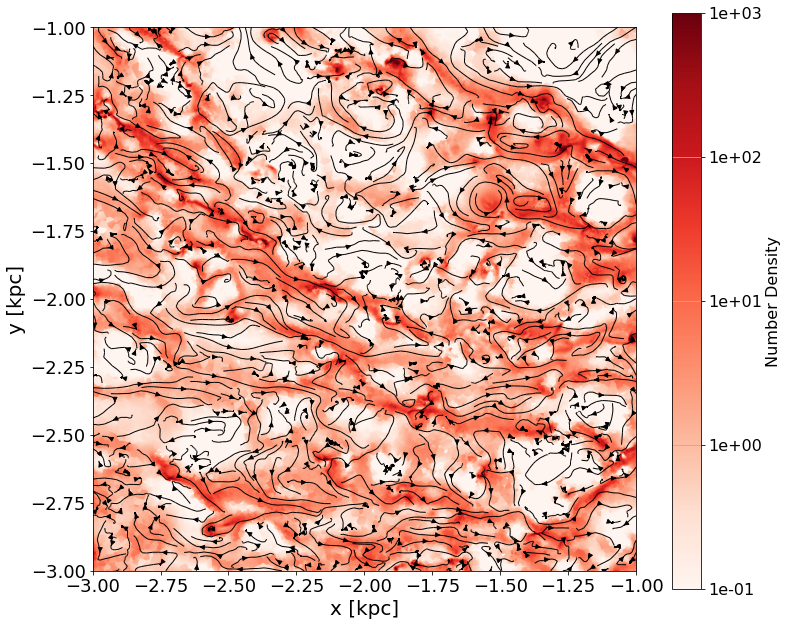

In [22]:
slice_index = 500

# Plotting settings
extent = (tile_x[0], tile_x[1], tile_y[0], tile_y[1])
levels_dens = np.logspace(-1, 3, 256)
levels_mag = np.logspace(-2, 2, 256)
norm_dens = mc.BoundaryNorm(levels_dens, 256)
norm_mag = mc.BoundaryNorm(levels_mag, 256)

#########################################         SURFACE DENSITY PLOT WITH STREAMLINES        ############################################

B_field = magnetic_grid[:,:,slice_index,:]

extent = (tile_x[0], tile_x[1], tile_y[0], tile_y[1])

# B field 
mesh_x = np.linspace(tile_x[0], tile_x[1], 1000)
mesh_y = np.linspace(tile_y[0], tile_y[1], 1000)
mesh_X, mesh_Y = np.meshgrid(mesh_x, mesh_y)

U = (B_field[:,:,0] * umag * 1e6).T
V = (B_field[:,:,1] * umag * 1e6).T

fig, ax = plt.subplots(figsize=(10, 10))  # Set the figure size directly in subplots

ax.set_aspect(1)
ax.streamplot(mesh_X, mesh_Y, U, V, density=3, linewidth=1, color='k', cmap='Greys')

# Density
im = ax.imshow(yn_grid[:, :, slice_index].T, origin='lower', norm=norm_dens, cmap='Reds', extent=extent)
ax.set_xlabel('x [kpc]', fontsize=20)
ax.set_ylabel('y [kpc]', fontsize=20)
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=18)

# Adjust subplot parameters first
fig.subplots_adjust(right=0.9, wspace=0.0, hspace=0.0)

# Add the colorbar
cbar_ax = fig.add_axes([0.94, 0.1, 0.04, 0.8])  # Adjust the position of the colorbar if needed
cbar = plt.colorbar(im, cax=cbar_ax, ticks=[1e-1, 1e0, 1e1, 1e2, 1e3], format='%.0e')
cbar.set_label('Number Density', size=16)
cbar.ax.tick_params(labelsize=16)

# Add grid
plt.grid(b=True, which='major', axis='both')

# Save the plot if needed
if save_plots == True:
    plt.savefig(save_base + 'single_tile_total_with_streamlines.png', bbox_inches='tight', facecolor='white', edgecolor='white', dpi=300)

plt.savefig(save_base + 'single_tile_total_with_streamlines.png', bbox_inches='tight', facecolor='white', edgecolor='white', dpi=300)
    
plt.show()

### Single Tile HRO histograms ###

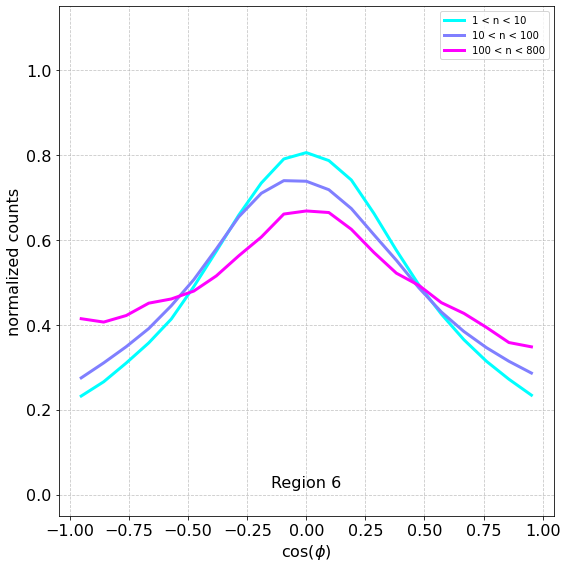

In [23]:
#single region HRO histogram result

fig = utils.plot_hro_histogram(
    outputs_dict={
        "bin_edges": total_outputs_dict["Total_bin_edges"],
        "hros": total_outputs_dict["Total_hros"]
    },
    region_indices=[6],
    colormap=cm.cool,
    colormap_range=(0, 1.0),
    legend_labels=['1 < n < 10', '10 < n < 100', '100 < n < 800'],
    nrows=1,
    ncols=1,
    subplot_size=(8,8)
)

if save_plots == True:
    fig.savefig(save_base + 'single_tile_hro_hist.png', bbox_inches='tight', facecolor='white', edgecolor='white', dpi=300)
    
plt.show()

### 3 Panel Single Tile Density and Field Lines, H species ###

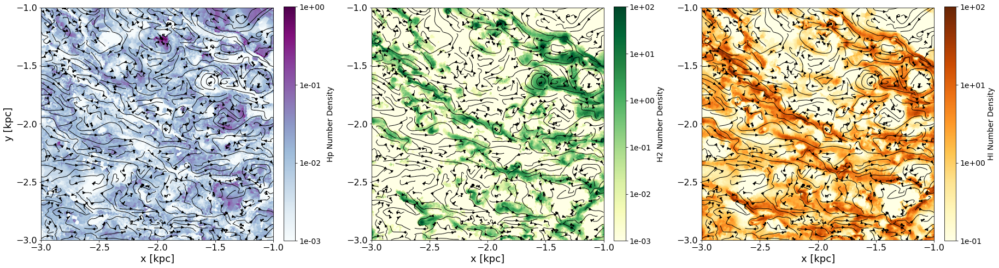

In [24]:
#from matplotlib.ticker import MaxNLocator
from matplotlib.ticker import MultipleLocator

slice_index = 500

# Plotting settings
extent = (tile_x[0], tile_x[1], tile_y[0], tile_y[1])

# Define levels for each plot
levels_H2_dens = np.logspace(-3, 2, 256)
levels_Hp_dens = np.logspace(-3, 0, 256)
levels_HI_dens = np.logspace(-1, 2, 256)

ticks_H2_dens = [1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2]
ticks_Hp_dens = [1e-3, 1e-2, 1e-1, 1e0]
ticks_HI_dens = [1e-1, 1e0, 1e1, 1e2]

norm_H2_dens = mc.BoundaryNorm(levels_H2_dens, 256)
norm_Hp_dens = mc.BoundaryNorm(levels_Hp_dens, 256)
norm_HI_dens = mc.BoundaryNorm(levels_HI_dens, 256)

levels_mag = np.logspace(-2, 2, 256)
norm_mag = mc.BoundaryNorm(levels_mag, 256)

B_field = magnetic_grid[:,:,slice_index,:]

mesh_x = np.linspace(tile_x[0],tile_x[1], 1000)
mesh_y = np.linspace(tile_y[0],tile_y[1], 1000)
mesh_X, mesh_Y = np.meshgrid(mesh_x, mesh_y)

U = (B_field[:,:,0] * umag * 1e6).T
V = (B_field[:,:,1] * umag * 1e6).T

# Create 1x3 grid of subplots
fig, axes = plt.subplots(1, 3, figsize=(30, 10))
fig.subplots_adjust(right=0.9, wspace=0.3, hspace=0)

# Plotting function
def plot_number_density_with_streamlines(ax, data, norm, cmap, label, ticks):
    ax.set_aspect(1)
    ax.streamplot(mesh_X, mesh_Y, U, V, density=2, linewidth=1, color='k')
    im = ax.imshow(data[:, :, slice_index].T, origin='lower', norm=norm, cmap=cmap, extent=extent)
    cbar = plt.colorbar(im, ax=ax, ticks=ticks, format='%.0e', fraction=0.046, pad=0.04)
    cbar.set_label(label, size=14)
    cbar.ax.tick_params(labelsize=14)

# Plot each surface density with streamlines
plot_number_density_with_streamlines(axes[0], Hp_grid, norm_Hp_dens, 'BuPu', 'Hp Number Density', ticks_Hp_dens)
plot_number_density_with_streamlines(axes[1], H2_grid, norm_H2_dens, 'YlGn', 'H2 Number Density', ticks_H2_dens)
plot_number_density_with_streamlines(axes[2], HI_grid, norm_HI_dens, 'YlOrBr', 'HI Number Density', ticks_HI_dens)

# Adjust labels and ticks
for i, ax in enumerate(axes.flat):
    ax.set_xlabel('x [kpc]', fontsize=18)
    if i != 0:
        ax.set_ylabel('')
    ax.tick_params(axis='x', labelsize=16)
    ax.tick_params(axis='y', labelsize=16)

    # Set tick intervals to 0.5 kpc
    ax.xaxis.set_major_locator(MultipleLocator(0.5)) #MaxNLocator(integer=False, nbins=5, prune=None)
    ax.yaxis.set_major_locator(MultipleLocator(0.5)) #MaxNLocator(integer=False, nbins=5, prune=None)

axes[0].set_ylabel('y [kpc]', fontsize=18)
    
if save_plots == True:
    plt.savefig(save_base + 'three_panel_H_species_density_with_streamlines.png', bbox_inches='tight', facecolor='white', edgecolor='white', dpi=300)

plt.show()

### 3 Panel Single Tile HRO Hists, H species ###

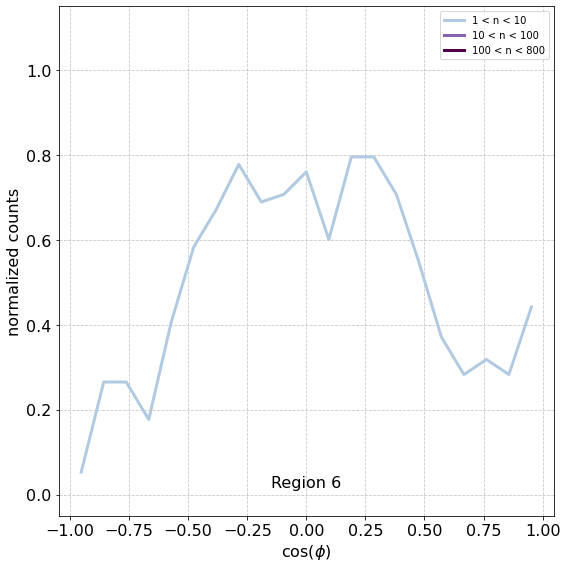

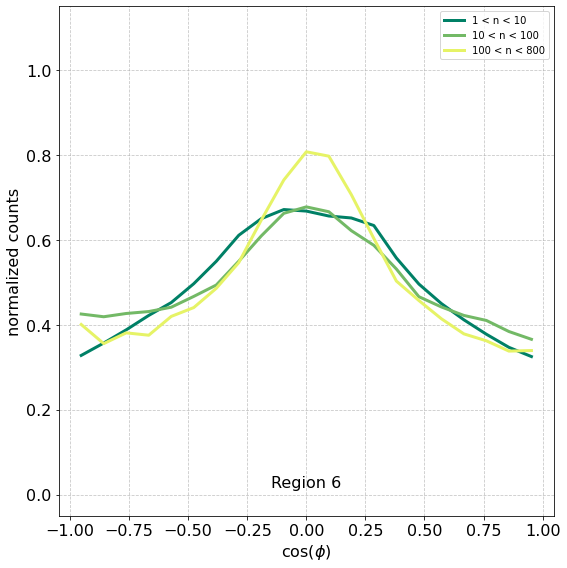

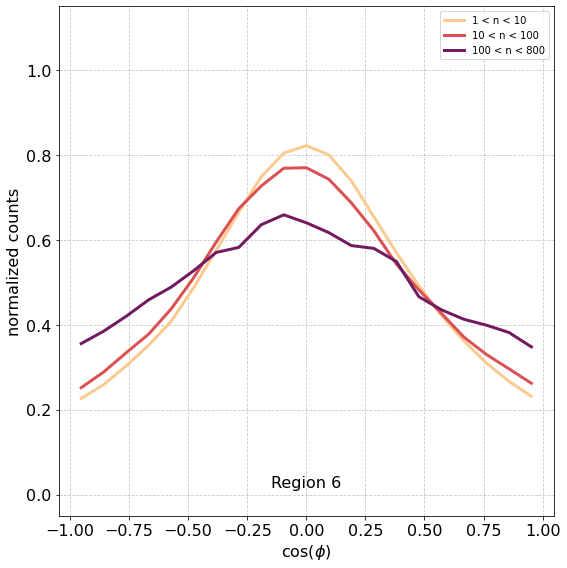

In [25]:
fig1 = utils.plot_hro_histogram(
    outputs_dict={
        "bin_edges": Hp_outputs_dict["Hp_bin_edges"],
        "hros": Hp_outputs_dict["Hp_hros"]
    },
    region_indices=[6],
    colormap=cm.BuPu,
    colormap_range=(0.3, 1.0),
    legend_labels=['1 < n < 10', '10 < n < 100', '100 < n < 800'],
    nrows=1,
    ncols=1,
    subplot_size=(8,8)
)

fig2 = utils.plot_hro_histogram(
    outputs_dict={
        "bin_edges": H2_outputs_dict["H2_bin_edges"],
        "hros": H2_outputs_dict["H2_hros"]
    },
    region_indices=[6],
    colormap=cm.summer,
    colormap_range=(0, 0.9),
    legend_labels=['1 < n < 10', '10 < n < 100', '100 < n < 800'],
    nrows=1,
    ncols=1,
    subplot_size=(8,8)
)

import cmocean

fig3 = utils.plot_hro_histogram(
    outputs_dict={
        "bin_edges": HI_outputs_dict["HI_bin_edges"],
        "hros": HI_outputs_dict["HI_hros"]
    },
    region_indices=[6],
    colormap=cmocean.cm.matter,
    colormap_range=(0.1, 0.8),
    legend_labels=['1 < n < 10', '10 < n < 100', '100 < n < 800'],
    nrows=1,
    ncols=1,
    subplot_size=(8,8)
)

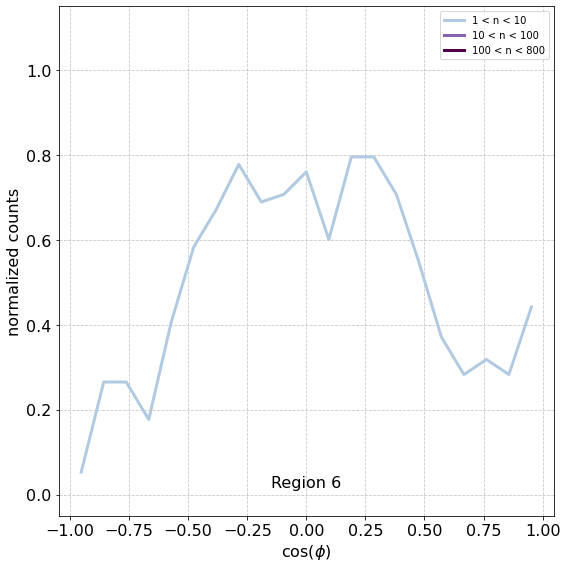

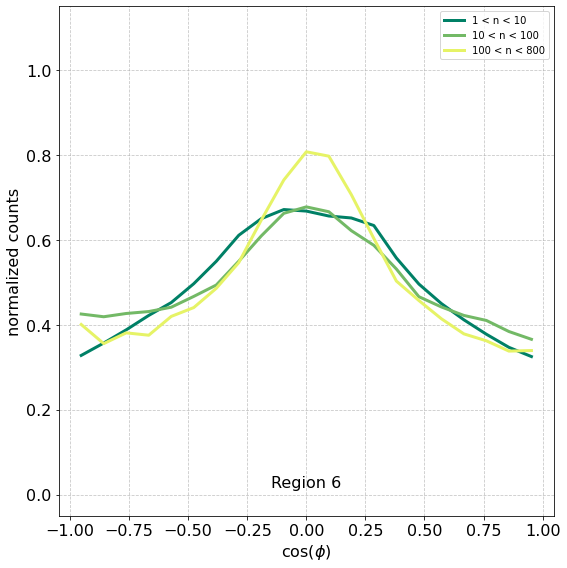

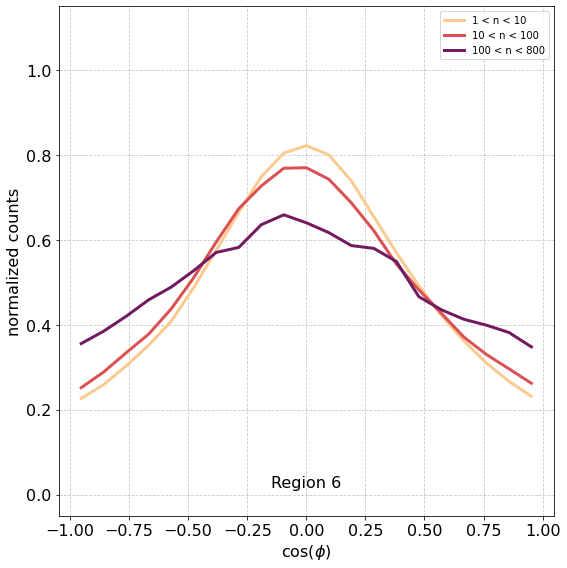

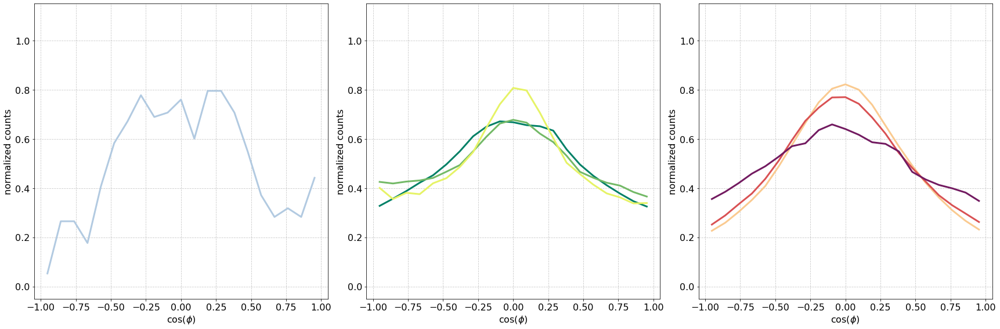

In [26]:
import cmocean

# Get the figures and axes from the plotting function
fig1, ax1 = utils.plot_hro_histogram(
    outputs_dict={
        "bin_edges": Hp_outputs_dict["Hp_bin_edges"],
        "hros": Hp_outputs_dict["Hp_hros"]
    },
    region_indices=[6],
    colormap=cm.BuPu,
    colormap_range=(0.3, 1.0),
    legend_labels=['1 < n < 10', '10 < n < 100', '100 < n < 800'],
    nrows=1,
    ncols=1,
    subplot_size=(8,8)
)

fig2, ax2 = utils.plot_hro_histogram(
    outputs_dict={
        "bin_edges": H2_outputs_dict["H2_bin_edges"],
        "hros": H2_outputs_dict["H2_hros"]
    },
    region_indices=[6],
    colormap=cm.summer,
    colormap_range=(0, 0.9),
    legend_labels=['1 < n < 10', '10 < n < 100', '100 < n < 800'],
    nrows=1,
    ncols=1,
    subplot_size=(8,8)
)

fig3, ax3 = utils.plot_hro_histogram(
    outputs_dict={
        "bin_edges": HI_outputs_dict["HI_bin_edges"],
        "hros": HI_outputs_dict["HI_hros"]
    },
    region_indices=[6],
    colormap=cmocean.cm.matter,
    colormap_range=(0.1, 0.8),
    legend_labels=['1 < n < 10', '10 < n < 100', '100 < n < 800'],
    nrows=1,
    ncols=1,
    subplot_size=(8,8)
)

# Create a new figure for the combined plot
combined_fig, combined_axs = plt.subplots(1, 3, figsize=(24, 8))

def copy_axes(source_ax, target_ax):
    for line in source_ax.lines:
        target_ax.plot(line.get_xdata(), line.get_ydata(), color=line.get_color(), linewidth=line.get_linewidth())
    
    # Copy labels, titles, and limits
    target_ax.set_xlabel(source_ax.get_xlabel(), fontsize=16)
    target_ax.set_ylabel(source_ax.get_ylabel(), fontsize=16)
    target_ax.grid(linestyle='--', alpha=0.7)
    target_ax.set_ylim(source_ax.get_ylim())
    target_ax.tick_params(labelsize=16)
    target_ax.set_title(source_ax.get_title())

    # Copy legend
    handles, labels = source_ax.get_legend_handles_labels()
    if handles:
        target_ax.legend(handles, labels, fontsize=10, loc='upper right')

# Copy each subplot
copy_axes(ax1[0, 0], combined_axs[0])
copy_axes(ax2[0, 0], combined_axs[1])
copy_axes(ax3[0, 0], combined_axs[2])

# Adjust layout
combined_fig.tight_layout()

# Save or show the combined figure
plt.savefig('/cosma8/data/dp058/dc-bogu1/Paper_2_Plots/three_panel_hro.png', bbox_inches='tight', facecolor='white', edgecolor='white', dpi=300)
plt.show()

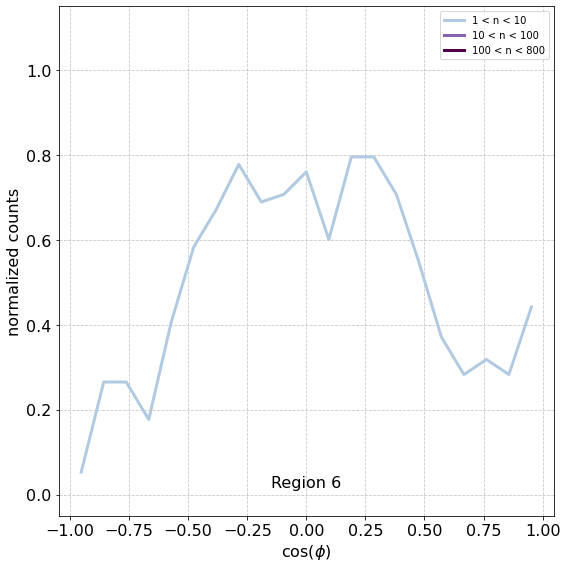

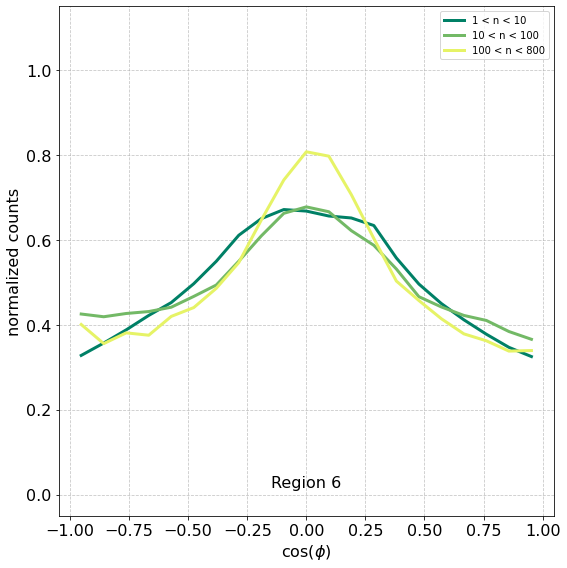

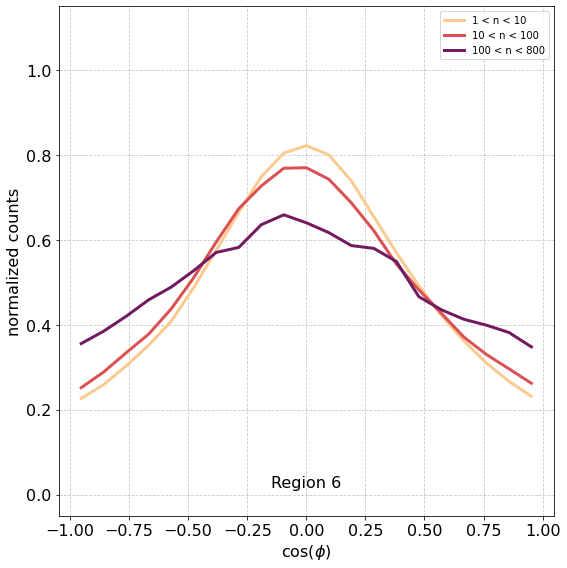

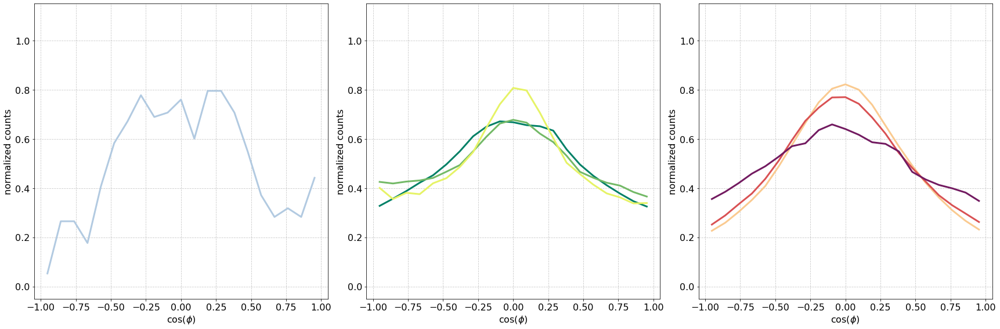

In [27]:
# Assuming the plotting function is already defined as previously modified
fig1, ax1 = utils.plot_hro_histogram(
    outputs_dict={
        "bin_edges": Hp_outputs_dict["Hp_bin_edges"],
        "hros": Hp_outputs_dict["Hp_hros"]
    },
    region_indices=[6],
    colormap=cm.BuPu,
    colormap_range=(0.3, 1.0),
    legend_labels=['1 < n < 10', '10 < n < 100', '100 < n < 800'],
    nrows=1,
    ncols=1,
    subplot_size=(8,8)
)

fig2, ax2 = utils.plot_hro_histogram(
    outputs_dict={
        "bin_edges": H2_outputs_dict["H2_bin_edges"],
        "hros": H2_outputs_dict["H2_hros"]
    },
    region_indices=[6],
    colormap=cm.summer,
    colormap_range=(0, 0.9),
    legend_labels=['1 < n < 10', '10 < n < 100', '100 < n < 800'],
    nrows=1,
    ncols=1,
    subplot_size=(8,8)
)

fig3, ax3 = utils.plot_hro_histogram(
    outputs_dict={
        "bin_edges": HI_outputs_dict["HI_bin_edges"],
        "hros": HI_outputs_dict["HI_hros"]
    },
    region_indices=[6],
    colormap=cmocean.cm.matter,
    colormap_range=(0.1, 0.8),
    legend_labels=['1 < n < 10', '10 < n < 100', '100 < n < 800'],
    nrows=1,
    ncols=1,
    subplot_size=(8,8)
)

# Create a new figure for the combined plot
combined_fig, combined_axs = plt.subplots(1, 3, figsize=(24, 8))

# Function to copy axes content and legends
def copy_axes(source_ax, target_ax):
    for line in source_ax.lines:
        target_ax.plot(line.get_xdata(), line.get_ydata(), color=line.get_color(), linewidth=line.get_linewidth())
    
    # Copy labels, titles, and limits
    target_ax.set_xlabel(source_ax.get_xlabel(), fontsize=16)
    target_ax.set_ylabel(source_ax.get_ylabel(), fontsize=16)
    target_ax.grid(linestyle='--', alpha=0.7)
    target_ax.set_ylim(source_ax.get_ylim())
    target_ax.tick_params(labelsize=16)
    target_ax.set_title(source_ax.get_title())

    # Copy legend
    handles, labels = source_ax.get_legend_handles_labels()
    if handles:
        target_ax.legend(handles, labels, fontsize=10, loc='upper right')

# Copy each subplot
copy_axes(ax1[0, 0], combined_axs[0])
copy_axes(ax2[0, 0], combined_axs[1])
copy_axes(ax3[0, 0], combined_axs[2])

# Adjust layout
combined_fig.tight_layout()

# Save or show the combined figure
#plt.savefig('combined_figure.png', facecolor='white', edgecolor='white', dpi=300)
plt.show()


### Central Slice of Density Grid Data (With Grid Boundaries) ###

In [23]:
if load_all_grids == True:
    total_yn_grids_cut = []
    magnetic_grids_cut = []

    # Get the list of grid origin coordinates
    grid_origin_coords_list = catalogue_df['Bottom-Left Coordinate [$kpc$]'].tolist()
    
    for grid_origin_coords in grid_origin_coords_list:
        # Load density grid
        dens_grid = rsnap.read_grid(grid_base + 'tile_grids/density_grid_{}_{}'.format(*grid_origin_coords))
        rho_cgs_grid = dens_grid * udensity

        # Calculate yn grid
        xHe = 0.1
        mp = 1.6726231e-24
        yn_grid = rho_cgs_grid / ((1. + 4.0 * xHe) * mp)
        yn_grid[yn_grid < 0] = 0
        yn_grid_cut = yn_grid[:, :, 250:750]
        
        total_yn_grids_cut.append(yn_grid_cut)

        magnetic_grid = rsnap.read_vector_grid(grid_base + 'tile_grids/magnetic_grid_{}_{}'.format(*grid_origin_coords))
        magnetic_grid_cut = magnetic_grid[:, :, 250:750, :]

        magnetic_grids_cut.append(magnetic_grid_cut)

Loading file /cosma8/data/dp058/dc-bogu1/MHD_SIMS/GRID_TILE_MAKER/JEANS_FIX_90Myr/tile_grids/density_grid_-5_-5
[1000] [1000] [1000]
1000
Loading file /cosma8/data/dp058/dc-bogu1/MHD_SIMS/GRID_TILE_MAKER/JEANS_FIX_90Myr/tile_grids/magnetic_grid_-5_-5
[1000] [1000] [1000]
1000
Loading file /cosma8/data/dp058/dc-bogu1/MHD_SIMS/GRID_TILE_MAKER/JEANS_FIX_90Myr/tile_grids/density_grid_-5_-3
[1000] [1000] [1000]
1000
Loading file /cosma8/data/dp058/dc-bogu1/MHD_SIMS/GRID_TILE_MAKER/JEANS_FIX_90Myr/tile_grids/magnetic_grid_-5_-3
[1000] [1000] [1000]
1000
Loading file /cosma8/data/dp058/dc-bogu1/MHD_SIMS/GRID_TILE_MAKER/JEANS_FIX_90Myr/tile_grids/density_grid_-5_-1
[1000] [1000] [1000]
1000
Loading file /cosma8/data/dp058/dc-bogu1/MHD_SIMS/GRID_TILE_MAKER/JEANS_FIX_90Myr/tile_grids/magnetic_grid_-5_-1
[1000] [1000] [1000]
1000
Loading file /cosma8/data/dp058/dc-bogu1/MHD_SIMS/GRID_TILE_MAKER/JEANS_FIX_90Myr/tile_grids/density_grid_-5_1
[1000] [1000] [1000]
1000
Loading file /cosma8/data/dp058/

In [24]:
grid_origin_coords_list = [(-5, -5), (-5, -3), (-5, -1), (-5, 1), (-5, 3), 
                           (-3, -5), (-3, -3), (-3, -1), (-3, 1), (-3, 3),  
                           (-1, -5), (-1, -3), (-1, -1), (-1, 1), (-1, 3), 
                           (1, -5), (1, -3), (1, -1), (1, 1), (1, 3),
                           (3, -5), (3, -3), (3, -1), (3, 1), (3, 3)]
    
##############

if load_all_grids == True:
    images = [grid[:, :, 250] for grid in total_yn_grids_cut]

    combined_image_array = utils.combine_images_into_grid(images, grid_size=(5, 5))

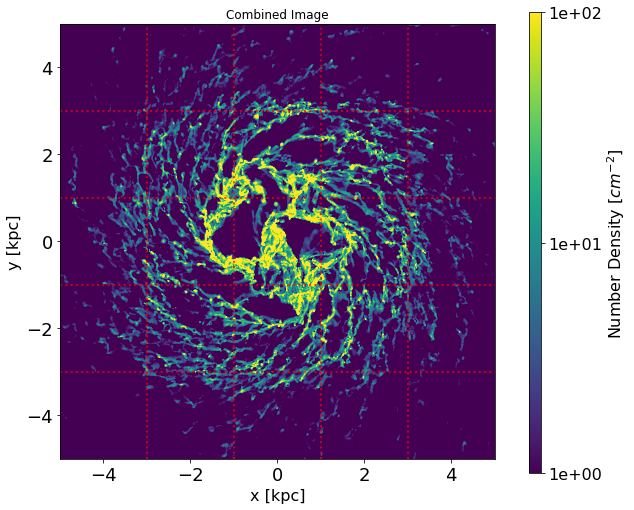

In [25]:
if load_all_grids == True:
    # Define the extent of the plot based on the physical scale in kiloparsecs
    extent_kpc = (-5, 5, -5, 5)  # Adjusted to -5 to 5 on both x and y axes in kpc

    # Set the levels for the color map
    levels = np.logspace(0, 2, 256)
    norm = mc.BoundaryNorm(levels, 256)

    # Set up the plot
    fig, ax = plt.subplots(figsize=(8, 8))

    # Plot the combined image array
    im = ax.imshow(combined_image_array.T, origin='lower', norm=norm, cmap='viridis', extent=extent_kpc)
    ax.set_title('Combined Image')
    ax.set_xlabel('x [kpc]', fontsize=16)
    ax.set_ylabel('y [kpc]', fontsize=16)
    ax.set_aspect('equal')  # Ensure aspect ratio is equal

    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)

    # Add vertical lines to show tile boundaries
    for i in range(-3, 5, 2):
        ax.axvline(i, color='r', linestyle=':', linewidth=2, alpha=0.7)

    # Add horizontal lines to show tile boundaries
    for j in range(-3, 5, 2):
        ax.axhline(j, color='r', linestyle=':', linewidth=2, alpha=0.7)

    # Move the color bar to the left
    fig.subplots_adjust(right=0.9)
    fig.subplots_adjust(wspace=0.0, hspace=0.0)
    cbar_ax = fig.add_axes([0.95, 0.1, 0.02, 0.8])
    cbar = plt.colorbar(im, cax=cbar_ax, ticks=[1e+0, 1e+1, 1e+2], format='%.0e')
    cbar.set_label('Number Density [$cm^{-2}$]', size=16)
    cbar.ax.tick_params(labelsize=16)

    plt.show()

### Full Density and Field Lines ###

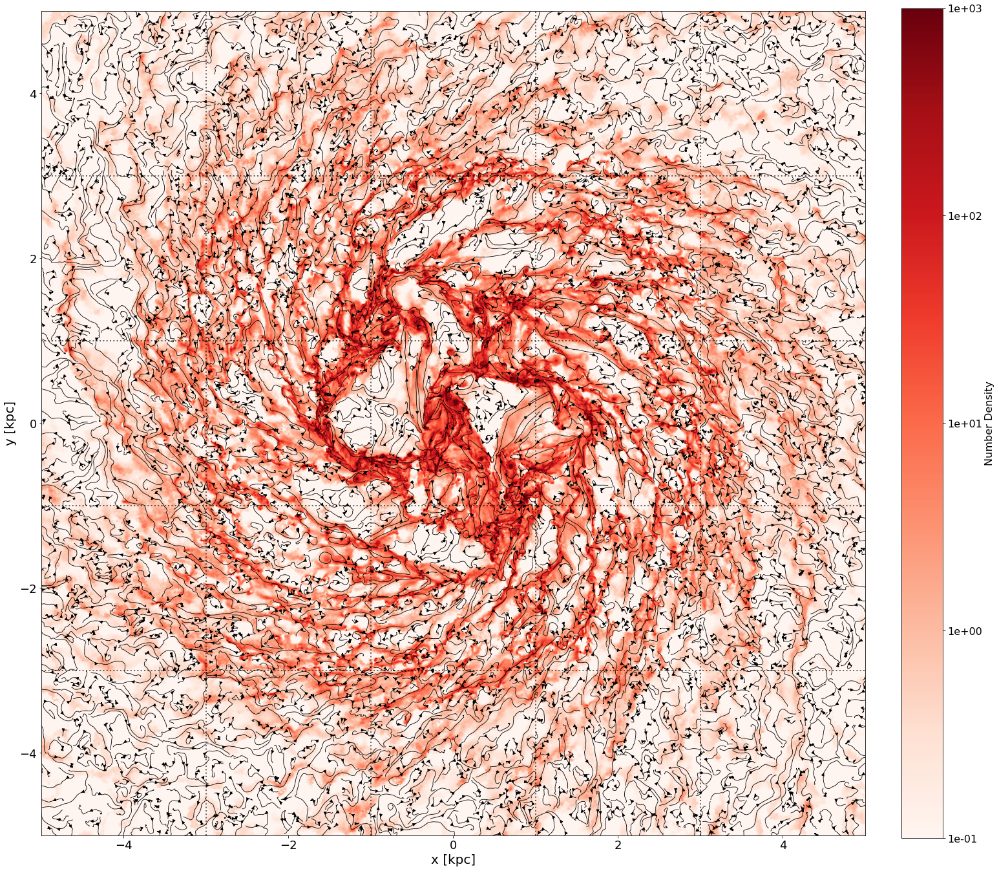

In [26]:
if load_all_grids == True:
    # Define the grid dimensions
    num_grids_x = 5  # Number of grids along the x-axis
    num_grids_y = 5  # Number of grids along the y-axis
    grid_size = 1000  # Each grid is 1000x1000 voxels

    # Initialize combined grids
    combined_yn_grid = np.zeros((num_grids_x * grid_size, num_grids_y * grid_size))
    combined_mag_grid = np.zeros((num_grids_x * grid_size, num_grids_y * grid_size, 2))

    # Loop through each grid and place it in the combined grid
    for i in range(num_grids_x):
        for j in range(num_grids_y):
            index = i * num_grids_y + j
            region_yn_grid = total_yn_grids_cut[index][:, :, 250]
            region_mag_grid = magnetic_grids_cut[index][:, :, 250, :]

            x_start = i * grid_size
            x_end = (i + 1) * grid_size
            y_start = j * grid_size
            y_end = (j + 1) * grid_size

            combined_yn_grid[x_start:x_end, y_start:y_end] = region_yn_grid
            combined_mag_grid[x_start:x_end, y_start:y_end, 0] = region_mag_grid[:, :, 0]  # Bx
            combined_mag_grid[x_start:x_end, y_start:y_end, 1] = region_mag_grid[:, :, 1]  # By

    # Plotting settings
    extent = (-5, 5, -5, 5)  # The extent of the entire grid in kpc
    levels_dens = np.logspace(-1, 3, 256)
    levels_mag = np.logspace(-2, 2, 256)
    norm_dens = mc.BoundaryNorm(levels_dens, 256)
    norm_mag = mc.BoundaryNorm(levels_mag, 256)

    # Plot the combined density and magnetic field
    fig, ax = plt.subplots(figsize=(25, 25))

    mesh_x = np.linspace(-5, 5, num_grids_x * grid_size)
    mesh_y = np.linspace(-5, 5, num_grids_y * grid_size)
    mesh_X, mesh_Y = np.meshgrid(mesh_x, mesh_y)

    U_combined = (combined_mag_grid[:, :, 0] * umag * 1e6).T
    V_combined = (combined_mag_grid[:, :, 1] * umag * 1e6).T

    ax.streamplot(mesh_X, mesh_Y, U_combined, V_combined, density=10, linewidth=0.85, color='k', cmap='Greys') # this many streamlines will take a while to plot!
    im_combined = ax.imshow(combined_yn_grid.T, origin='lower', norm=norm_dens, cmap='Reds', extent=extent)

    # Additional settings for the combined plot
    ax.set_xlabel('x [kpc]', fontsize=20)
    ax.set_ylabel('y [kpc]', fontsize=20)
    ax.tick_params(axis='x', labelsize=18)
    ax.tick_params(axis='y', labelsize=18)

    # Add vertical lines to show tile boundaries
    for i in range(-3, 5, 2):
        ax.axvline(i , color='k', linestyle=':', linewidth=2, alpha=0.6)

    # Add horizontal lines to show tile boundaries
    for j in range(-3, 5, 2):
        ax.axhline(j , color='k', linestyle=':', linewidth=2, alpha=0.6)

    # Add colorbar
    cbar_combined = plt.colorbar(im_combined, ax=ax, fraction=0.046, pad=0.04, ticks=[1e-1, 1e0, 1e1, 1e2, 1e3], format='%.0e')
    cbar_combined.set_label('Number Density', size=16)
    cbar_combined.ax.tick_params(labelsize=16)

    if save_plots == True:
        plt.savefig(save_base + 'combined_total_with_streamlines.png', bbox_inches='tight', facecolor='white', edgecolor='white', dpi=300)

    plt.show()

### All HRO Histograms ###

/cosma/home/dp058/dc-bogu1/notebooks/arepy/utils.py:1221: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] * len(ax.get_xticks()))  # Remove tick labels
/cosma/home/dp058/dc-bogu1/notebooks/arepy/utils.py:1227: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] * len(ax.get_yticks()))  # Remove tick labels


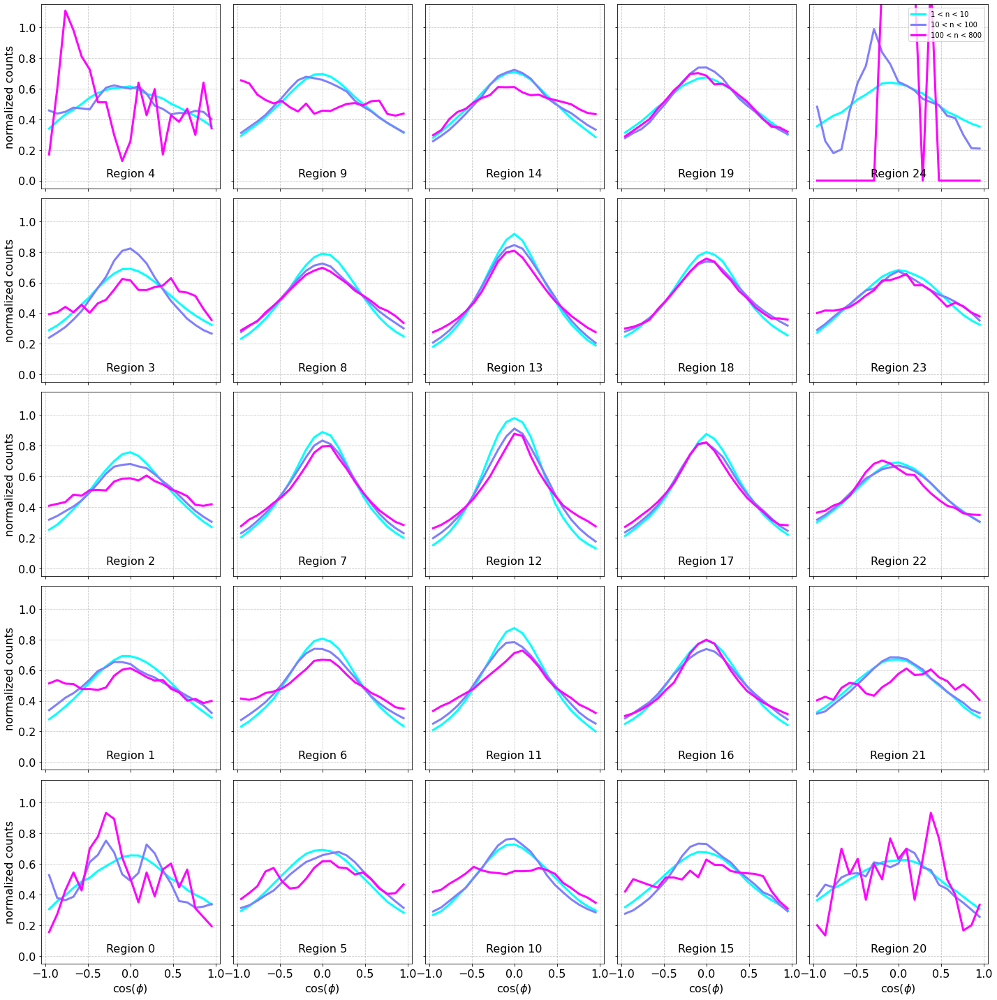

In [27]:
# Total with 5x5 grid

fig = utils.plot_hro_histogram(
    outputs_dict={
        "bin_edges": total_outputs_dict["Total_bin_edges"],
        "hros": total_outputs_dict["Total_hros"]
    },
    region_indices=[4, 9, 14, 19, 24, 3, 8, 13, 18, 23, 2, 7, 12, 17, 22, 1, 6, 11, 16, 21, 0, 5, 10, 15, 20],
    colormap=cm.cool,
    colormap_range=(0, 1.0),
    legend_labels=['1 < n < 10', '10 < n < 100', '100 < n < 800'],
    nrows=5,
    ncols=5,
    legend_region_index=24
)

if save_plots == True:
    fig.savefig(save_base + 'combined_total_hro_hist.png', bbox_inches='tight', facecolor='white', edgecolor='white', dpi=300)
    
plt.show()

/cosma/home/dp058/dc-bogu1/notebooks/arepy/utils.py:1221: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] * len(ax.get_xticks()))  # Remove tick labels
/cosma/home/dp058/dc-bogu1/notebooks/arepy/utils.py:1227: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] * len(ax.get_yticks()))  # Remove tick labels


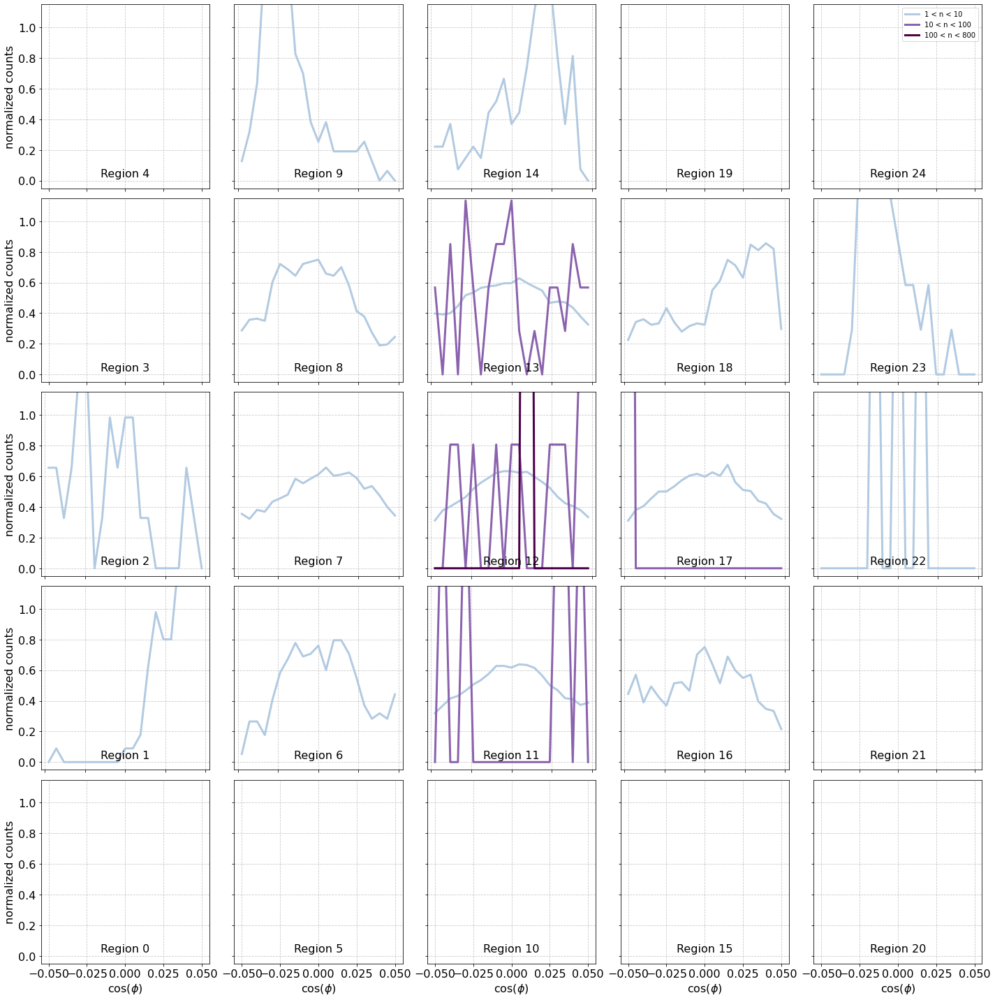

In [28]:
# Hp with 5x5 grid

fig = utils.plot_hro_histogram(
    outputs_dict={
        "bin_edges": Hp_outputs_dict["Hp_bin_edges"],
        "hros": Hp_outputs_dict["Hp_hros"]
    },
    region_indices=[4, 9, 14, 19, 24, 3, 8, 13, 18, 23, 2, 7, 12, 17, 22, 1, 6, 11, 16, 21, 0, 5, 10, 15, 20],
    colormap=cm.BuPu,
    colormap_range=(0.3, 1.0),
    legend_labels=['1 < n < 10', '10 < n < 100', '100 < n < 800'],
    nrows=5,
    ncols=5,
    legend_region_index=24
)

if save_plots == True:
    fig.savefig(save_base + 'combined_hp_hro_hist.png', bbox_inches='tight', facecolor='white', edgecolor='white', dpi=300)
    
plt.show()

/cosma/home/dp058/dc-bogu1/notebooks/arepy/utils.py:1221: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] * len(ax.get_xticks()))  # Remove tick labels
/cosma/home/dp058/dc-bogu1/notebooks/arepy/utils.py:1227: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] * len(ax.get_yticks()))  # Remove tick labels


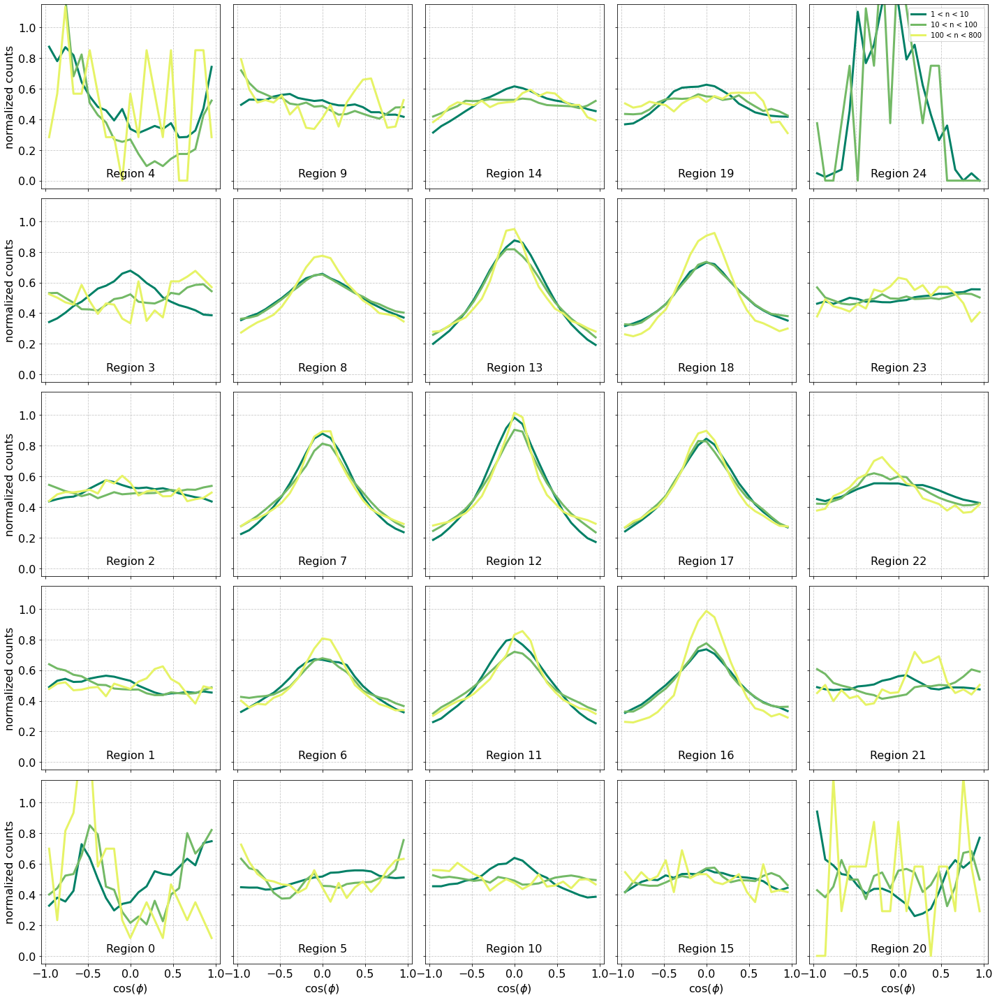

In [29]:
# H2 with 5x5 grid

fig = utils.plot_hro_histogram(
    outputs_dict={
        "bin_edges": H2_outputs_dict["H2_bin_edges"],
        "hros": H2_outputs_dict["H2_hros"]
    },
    region_indices=[4, 9, 14, 19, 24, 3, 8, 13, 18, 23, 2, 7, 12, 17, 22, 1, 6, 11, 16, 21, 0, 5, 10, 15, 20],
    colormap=cm.summer,
    colormap_range=(0, 0.9),
    legend_labels=['1 < n < 10', '10 < n < 100', '100 < n < 800'],
    nrows=5,
    ncols=5,
    legend_region_index=24
)

if save_plots == True:
    fig.savefig(save_base + 'combined_h2_hro_hist.png', bbox_inches='tight', facecolor='white', edgecolor='white', dpi=300)
    
plt.show()

/cosma/home/dp058/dc-bogu1/notebooks/arepy/utils.py:1221: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] * len(ax.get_xticks()))  # Remove tick labels
/cosma/home/dp058/dc-bogu1/notebooks/arepy/utils.py:1227: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] * len(ax.get_yticks()))  # Remove tick labels


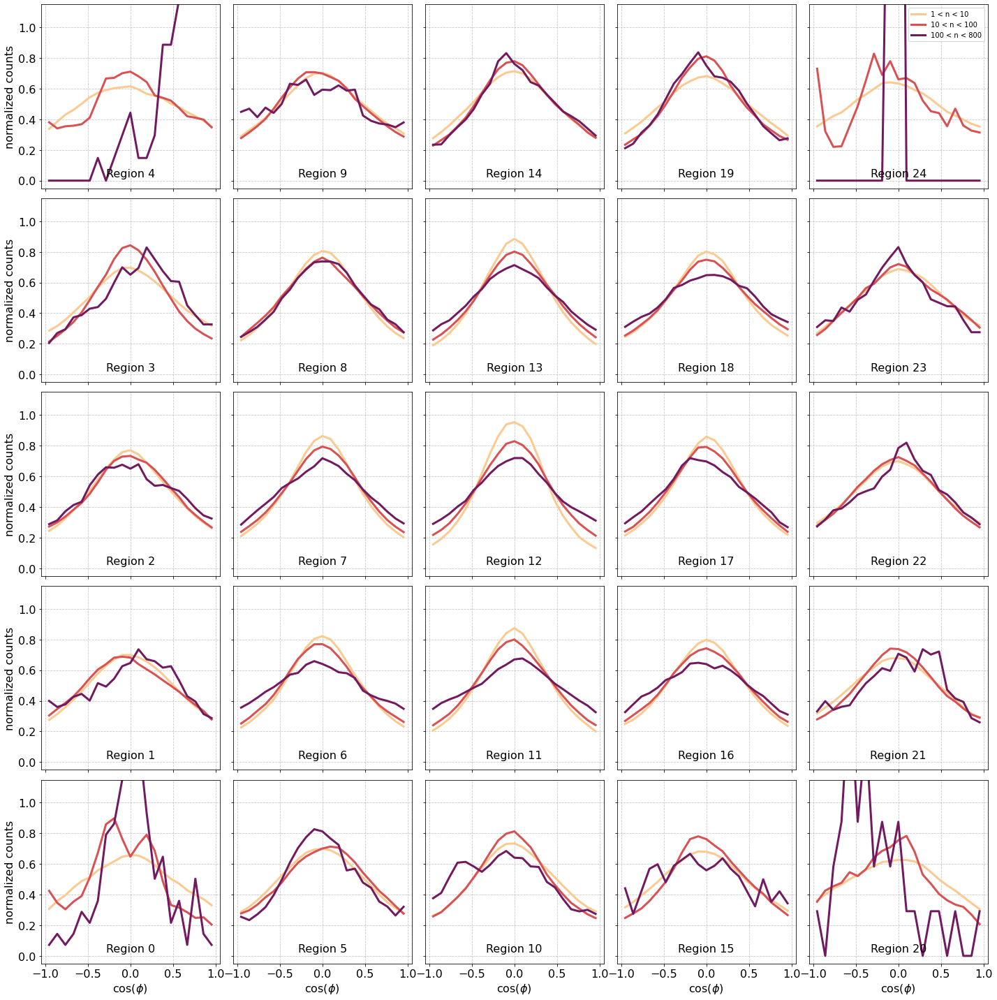

In [30]:
# HI with 5x5 grid

import cmocean

fig = utils.plot_hro_histogram(
    outputs_dict={
        "bin_edges": HI_outputs_dict["HI_bin_edges"],
        "hros": HI_outputs_dict["HI_hros"]
    },
    region_indices=[4, 9, 14, 19, 24, 3, 8, 13, 18, 23, 2, 7, 12, 17, 22, 1, 6, 11, 16, 21, 0, 5, 10, 15, 20],
    colormap=cmocean.cm.matter,
    colormap_range=(0.1, 0.8),
    legend_labels=['1 < n < 10', '10 < n < 100', '100 < n < 800'],
    nrows=5,
    ncols=5,
    legend_region_index=24
)

if save_plots == True:
    fig.savefig(save_base + 'combined_h1_hro_hist.png', bbox_inches='tight', facecolor='white', edgecolor='white', dpi=300)
    
plt.show()

## All HRO Bin Populations ##

/cosma/home/dp058/dc-bogu1/notebooks/arepy/utils.py:1318: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] * len(ax.get_xticks()))  # Remove tick labels
/cosma/home/dp058/dc-bogu1/notebooks/arepy/utils.py:1324: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] * len(ax.get_yticks()))  # Remove tick labels


<function matplotlib.pyplot.show(close=None, block=None)>

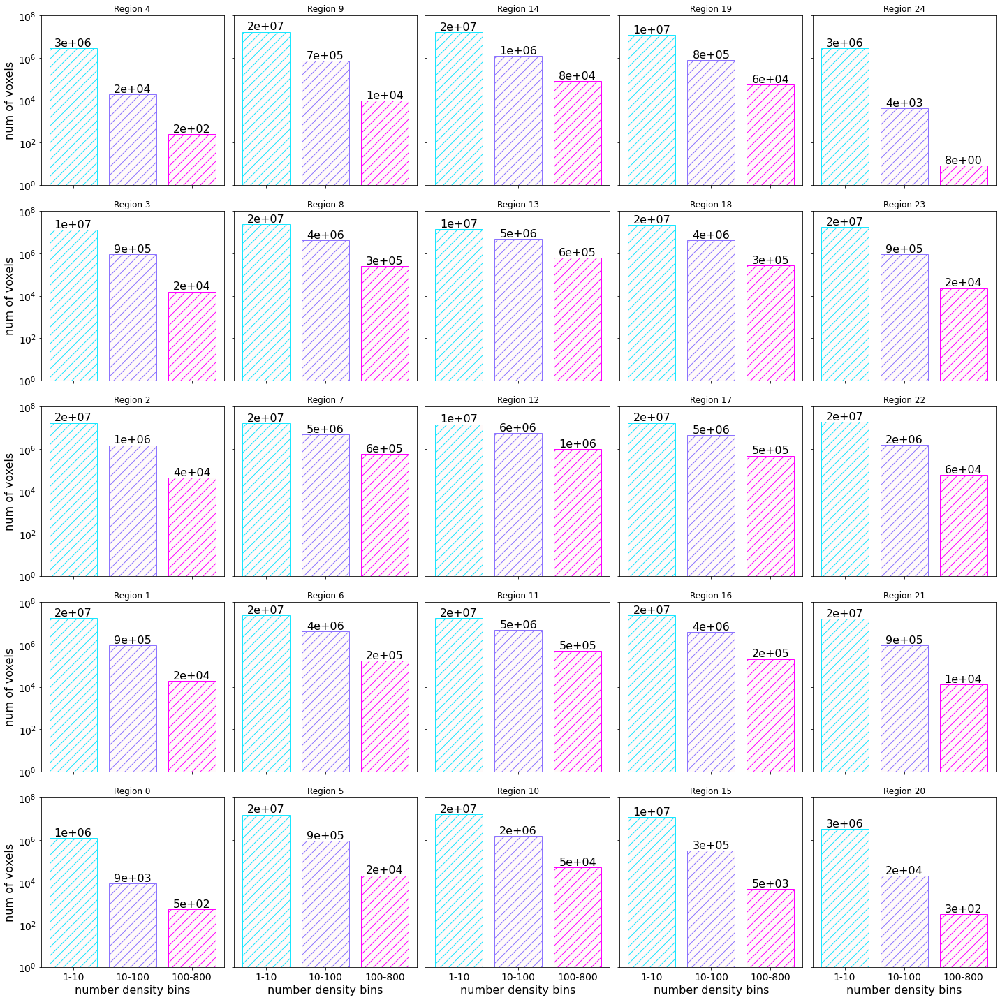

In [31]:
# Total with 5x5 grid

fig = utils.plot_density_bin_population(
     outputs_dict={
         "bin_pop": total_outputs_dict["Total_bin_pop"]
     },
     region_indices=[4, 9, 14, 19, 24, 3, 8, 13, 18, 23, 2, 7, 12, 17, 22, 1, 6, 11, 16, 21, 0, 5, 10, 15, 20],
     colormap=cm.cool,
     colormap_range=(0.1, 1.0),
     nrows=5,
     ncols=5
)

if save_plots == True:
    fig.savefig(save_base + 'combined_total_bin_pop.png', bbox_inches='tight', facecolor='white', edgecolor='white', dpi=300)
    
plt.show

/cosma/home/dp058/dc-bogu1/notebooks/arepy/utils.py:1318: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] * len(ax.get_xticks()))  # Remove tick labels
/cosma/home/dp058/dc-bogu1/notebooks/arepy/utils.py:1324: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] * len(ax.get_yticks()))  # Remove tick labels


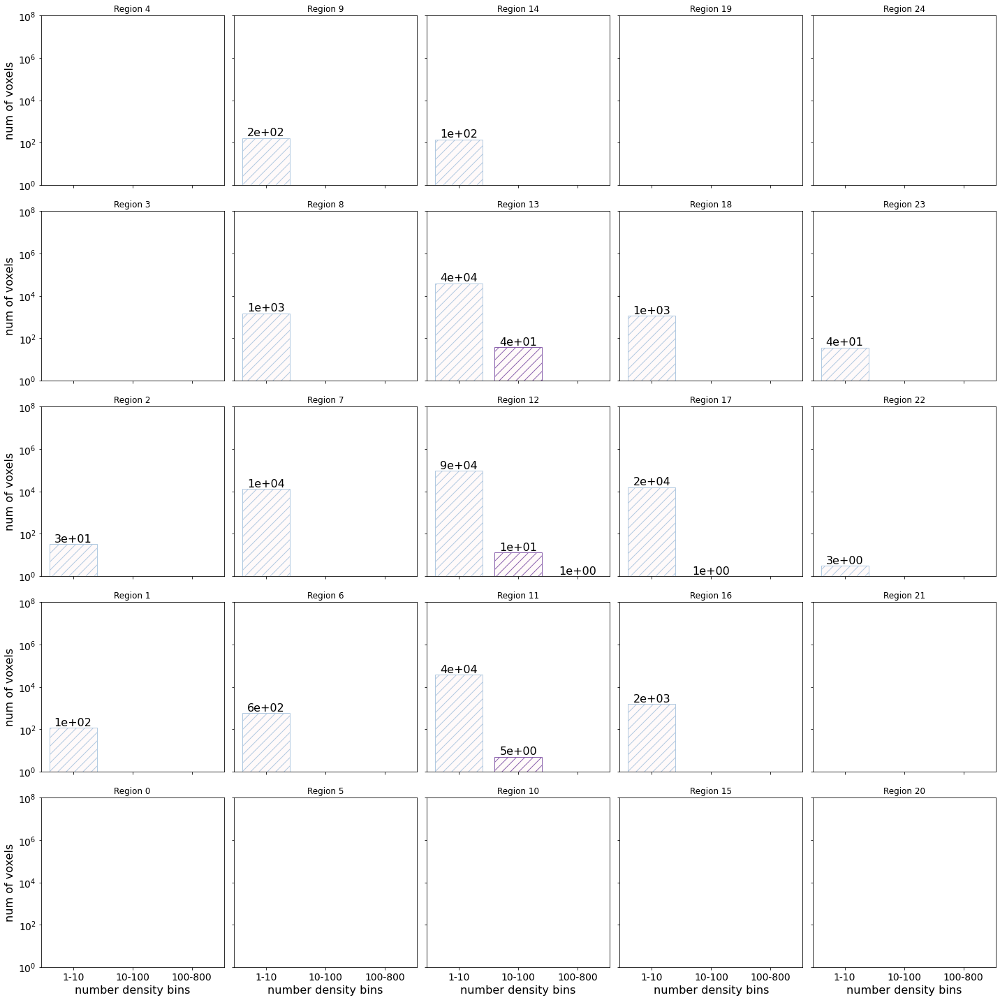

In [32]:
# Hp with 5x5 grid

fig = utils.plot_density_bin_population(
     outputs_dict={
         "bin_pop": Hp_outputs_dict["Hp_bin_pop"]
     },
    region_indices=[4, 9, 14, 19, 24, 3, 8, 13, 18, 23, 2, 7, 12, 17, 22, 1, 6, 11, 16, 21, 0, 5, 10, 15, 20],
    colormap=cm.BuPu,
    colormap_range=(0.3, 1.0),
    nrows=5,
    ncols=5,
)

if save_plots == True:
    fig.savefig(save_base + 'combined_hp_bin_pop.png', bbox_inches='tight', facecolor='white', edgecolor='white', dpi=300)
    
plt.show()

/cosma/home/dp058/dc-bogu1/notebooks/arepy/utils.py:1318: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] * len(ax.get_xticks()))  # Remove tick labels
/cosma/home/dp058/dc-bogu1/notebooks/arepy/utils.py:1324: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] * len(ax.get_yticks()))  # Remove tick labels


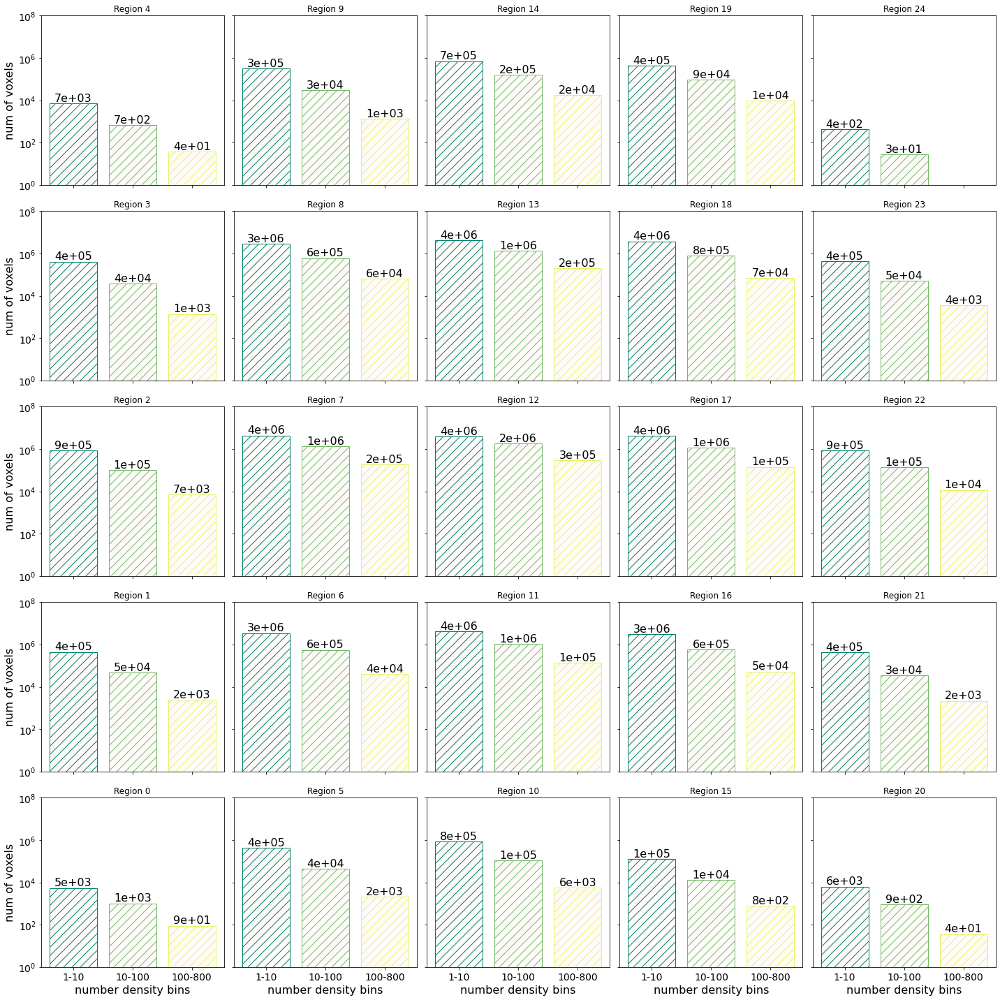

In [33]:
# H2 with 5x5 grid

fig = utils.plot_density_bin_population(
     outputs_dict={
         "bin_pop": H2_outputs_dict["H2_bin_pop"]
     },
     region_indices=[4, 9, 14, 19, 24, 3, 8, 13, 18, 23, 2, 7, 12, 17, 22, 1, 6, 11, 16, 21, 0, 5, 10, 15, 20],
     colormap=cm.summer,
     colormap_range=(0, 0.9),
     nrows=5,
     ncols=5
)

if save_plots == True:
    fig.savefig(save_base + 'combined_h2_bin_pop.png', bbox_inches='tight', facecolor='white', edgecolor='white', dpi=300)
    
plt.show()

/cosma/home/dp058/dc-bogu1/notebooks/arepy/utils.py:1318: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] * len(ax.get_xticks()))  # Remove tick labels
/cosma/home/dp058/dc-bogu1/notebooks/arepy/utils.py:1324: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] * len(ax.get_yticks()))  # Remove tick labels


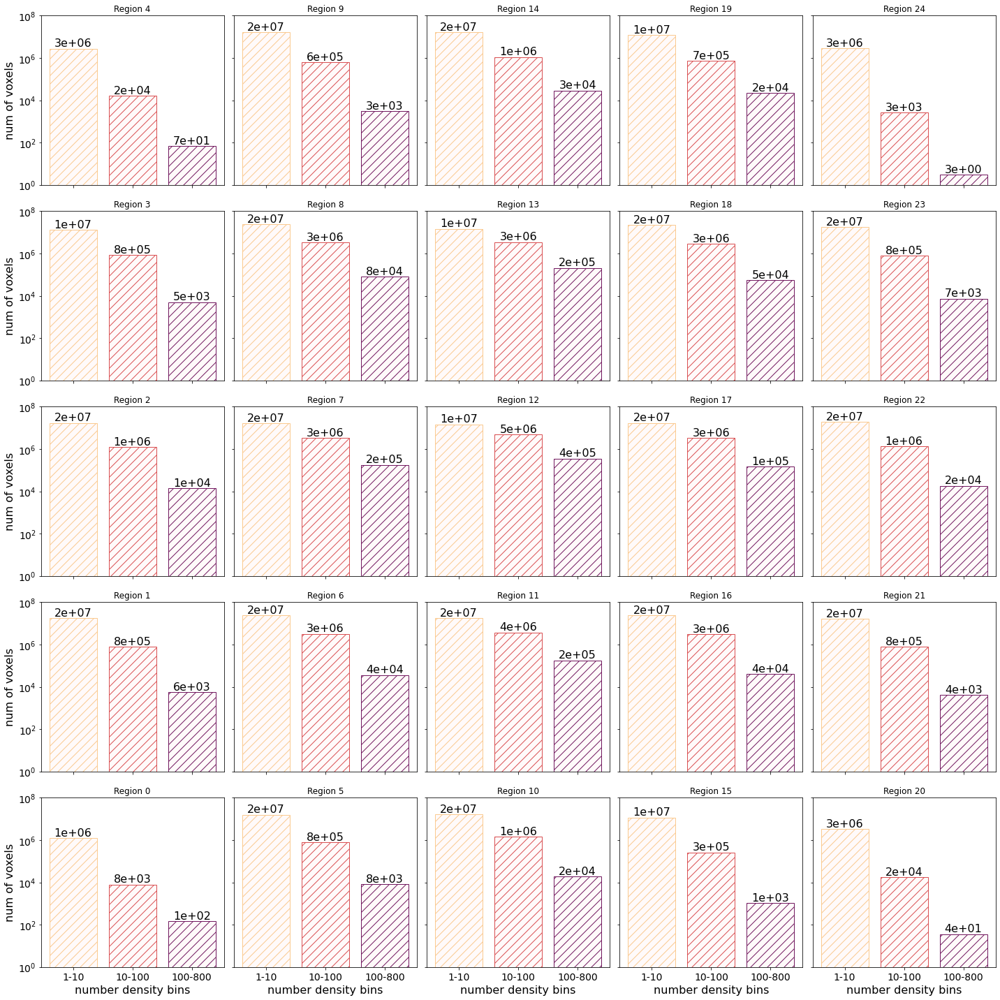

In [34]:
# HI with 5x5 grid

import cmocean

fig = utils.plot_density_bin_population(
     outputs_dict={
         "bin_pop": HI_outputs_dict["HI_bin_pop"]
     },
     region_indices=[4, 9, 14, 19, 24, 3, 8, 13, 18, 23, 2, 7, 12, 17, 22, 1, 6, 11, 16, 21, 0, 5, 10, 15, 20],
     colormap=cmocean.cm.matter,
     colormap_range=(0.1, 0.8),
     nrows=5,
     ncols=5
)

if save_plots == True:
    fig.savefig(save_base + 'combined_h1_bin_pop.png', bbox_inches='tight', facecolor='white', edgecolor='white', dpi=300)
    
plt.show()

### Full HRO Xi Result With All Species ###

/cosma/local/Python/3.6.5/lib/python3.6/site-packages/ipykernel_launcher.py:48: UserWarning: FixedFormatter should only be used together with FixedLocator
/cosma/local/Python/3.6.5/lib/python3.6/site-packages/ipykernel_launcher.py:54: UserWarning: FixedFormatter should only be used together with FixedLocator


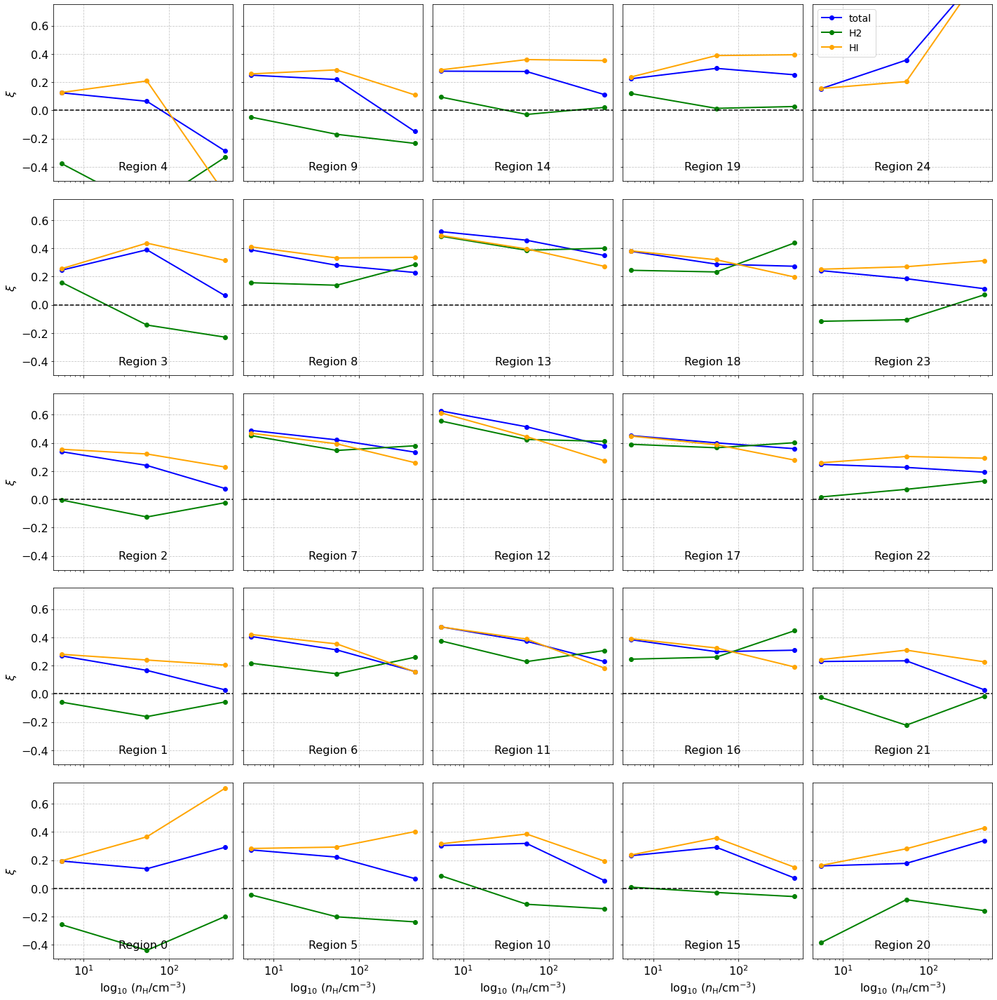

In [35]:
########## plot all HRO xi results for all regions ########## 

# Define the indices of the regions you want to plot
region_indices = [4, 9, 14, 19, 24, 3, 8, 13, 18, 23, 2, 7, 12, 17, 22, 1, 6, 11, 16, 21, 0, 5, 10, 15, 20]  # Change the indices as needed

# Define the figure and subplots
fig, axs = plt.subplots(5, 5, figsize=(20, 20))  # 5 rows, 5 columns

# Loop over each region index
for i, region_index in enumerate(region_indices):
    # Calculate the row and column indices for the current subplot
    row_index = i // 5
    col_index = i % 5
    
    # Get xi values for the current region
    xi_values =  total_outputs_dict['Total_xi'][region_index]
    #Hp_xi_values = Hp_outputs_dict['Hp_xi'][region_index]
    H2_xi_values = H2_outputs_dict['H2_xi'][region_index]
    HI_xi_values = HI_outputs_dict['HI_xi'][region_index]
    
    # Get cdens values
    cdens = total_outputs_dict['Total_cdens'][region_index]
    #Hp_cdens = Hp_outputs_dict['Hp_cdens'][region_index] 
    H2_cdens = H2_outputs_dict['H2_cdens'][region_index] 
    HI_cdens = HI_outputs_dict['HI_cdens'][region_index]   
    
    # Plot for the current region with specified line colors
    axs[row_index, col_index].semilogx(cdens, xi_values, 'o-', linewidth=2, color='blue', label='total') 
    #axs[row_index, col_index].semilogx(Hp_cdens, Hp_xi_values, 'o-', linewidth=2, color='purple', label='Hp')  
    axs[row_index, col_index].semilogx(H2_cdens, H2_xi_values, 'o-', linewidth=2, color='green', label='H2')  
    axs[row_index, col_index].semilogx(HI_cdens, HI_xi_values, 'o-', linewidth=2, color='orange', label='HI')
    
    axs[row_index, col_index].axhline(y=0., c='k', ls='--')  
    axs[row_index, col_index].set_xlabel(r'log$_{10}$ ($n_{\rm H}/$cm$^{-3}$)', fontsize=16)
    axs[row_index, col_index].set_ylabel(r'$\xi$', fontsize=16)
    axs[row_index, col_index].grid(linestyle='--', alpha=0.7)
    axs[row_index, col_index].tick_params(labelsize=16)
    axs[row_index, col_index].set_ylim(-0.5, 0.75)
    
    # Add text label at the bottom center
    axs[row_index, col_index].text(0.5, 0.05, f'Region {region_index}', transform=axs[row_index, col_index].transAxes, ha='center', va='bottom', fontsize=16)

# Add legend to the top right plot (region 15)
axs[0, 4].legend(fontsize=14, loc='best')

# Remove unnecessary x-axis labels and ticks except for the bottom row
for ax in axs[:-1, :].flat:
    ax.set_xticklabels([''] * len(ax.get_xticks()))  # Remove tick labels
    ax.set_xlabel('')
    ax.tick_params(axis='x', which='both', bottom=True, top=False)  # Keep tick markers
    
# Remove unnecessary y-axis labels and ticks except for the leftmost column
for ax in axs[:, 1:].flat:
    ax.set_yticklabels([''] * len(ax.get_yticks()))  # Remove tick labels
    ax.set_ylabel('')
    ax.tick_params(axis='y', which='both', left=True, right=False)  # Keep tick markers

# Adjust layout
plt.tight_layout()

if save_plots == True:
    plt.savefig(save_base + 'all_hro_xi.png', bbox_inches='tight', facecolor='white', edgecolor='white', dpi=300)

# Show the plot
plt.show()

## Filter Out Low Bin Population Results ##

In [36]:
catalogue_df.keys()

Index(['Bottom-Left Coordinate [$kpc$]', 'Total Volume Density [$gcm^{-3}$]',
       'Median Volume Density [$gcm^{-3}$]',
       'Median Magnetic Field Strength [$\mu G$]', 'Median Temperature [$K$]',
       'Total Gas Surface Density [$M_\odot pc^{-2}$]',
       'Median Gas Surface Density [$M_\odot pc^{-2}$]',
       'Median SFR Surface Density [$M_\odot yr^{-1} kpc^{-2}$]'],
      dtype='object')

In [37]:
# Function to add columns and assign values
def add_xi_columns(df, data_dict, gas_type):
    column_names = [
        f'HRO Xi 1 - 10 ({gas_type})',
        f'HRO Xi 10 - 100 ({gas_type})',
        f'HRO Xi 100 - 800 ({gas_type})'
    ]
    for col in column_names:
        df[col] = np.nan

    for i, values in enumerate(data_dict[f'{gas_type}_xi']):
        if i < len(df):
            df.at[i, column_names[0]] = values[0]
            df.at[i, column_names[1]] = values[1]
            df.at[i, column_names[2]] = values[2]

# Function to add bin population columns and assign values
def add_bin_pop_columns(df, data_dict, gas_type):
    column_names = [
        f'{gas_type} Density Population 1-10',
        f'{gas_type} Density Population 10-100',
        f'{gas_type} Density Population 100-800'
    ]
    for col in column_names:
        df[col] = np.nan

    for i, values in enumerate(data_dict[f'{gas_type}_bin_pop']):
        if i < len(df):
            df.at[i, column_names[0]] = values[0]
            df.at[i, column_names[1]] = values[1]
            df.at[i, column_names[2]] = values[2]

In [38]:
# Total_catalogue
Total_catalogue = catalogue_df.copy()
add_xi_columns(Total_catalogue, total_outputs_dict, 'Total') # Add Xi columns and assign values
add_bin_pop_columns(Total_catalogue, total_outputs_dict, 'Total') # Add bin population columns and assign values

# Hp_catalogue
Hp_catalogue = catalogue_df.copy()
add_xi_columns(Hp_catalogue, Hp_outputs_dict, 'Hp') # Add Xi columns and assign values
add_bin_pop_columns(Hp_catalogue, Hp_outputs_dict, 'Hp') # Add bin population columns and assign values

# H2_catalogue
H2_catalogue = catalogue_df.copy()
add_xi_columns(H2_catalogue, H2_outputs_dict, 'H2')
add_bin_pop_columns(H2_catalogue, H2_outputs_dict, 'H2') # Add bin population columns and assign values

# HI_catalogue
HI_catalogue = catalogue_df.copy()
add_xi_columns(HI_catalogue, HI_outputs_dict, 'HI')
add_bin_pop_columns(HI_catalogue, HI_outputs_dict, 'HI') # Add bin population columns and assign values

In [40]:
# Define the population threshold
population_threshold = 1e4

# Filter the data based on the population threshold
filter_1_10 = Total_catalogue[Total_catalogue['Total Density Population 1-10'] > population_threshold]
filter_10_100 = Total_catalogue[Total_catalogue['Total Density Population 10-100'] > population_threshold]
filter_100_800 = Total_catalogue[Total_catalogue['Total Density Population 100-800'] > population_threshold]

### Full FILTERED HRO Xi Result With All Species ###

In [41]:
# Initialize empty arrays for filtered xi values
filtered_total_xi = np.full((25, 3), np.nan)  # Assuming 25 regions and 3 density bins
filtered_Hp_xi = np.full((25, 3), np.nan)
filtered_H2_xi = np.full((25, 3), np.nan)
filtered_HI_xi = np.full((25, 3), np.nan)

# Loop over each region index
for i, region_index in enumerate(range(25)):  # Assuming 25 regions
    # Get bin populations for the current region
    total_bin_pop = Total_catalogue.iloc[region_index][['Total Density Population 1-10', 'Total Density Population 10-100', 'Total Density Population 100-800']].values
    Hp_bin_pop = Hp_catalogue.iloc[region_index][['Hp Density Population 1-10', 'Hp Density Population 10-100', 'Hp Density Population 100-800']].values
    H2_bin_pop = H2_catalogue.iloc[region_index][['H2 Density Population 1-10', 'H2 Density Population 10-100', 'H2 Density Population 100-800']].values
    HI_bin_pop = HI_catalogue.iloc[region_index][['HI Density Population 1-10', 'HI Density Population 10-100', 'HI Density Population 100-800']].values

    # Filter xi values based on bin populations
    for j in range(3):  # Iterate over density bins
        if total_bin_pop[j] > population_threshold:
            if j == 0:
                filtered_total_xi[i, j] = Total_catalogue.iloc[region_index]['HRO Xi 1 - 10 (Total)']
            elif j == 1:
                filtered_total_xi[i, j] = Total_catalogue.iloc[region_index]['HRO Xi 10 - 100 (Total)']
            elif j == 2:
                filtered_total_xi[i, j] = Total_catalogue.iloc[region_index]['HRO Xi 100 - 800 (Total)']
        if Hp_bin_pop[j] > population_threshold:
            if j == 0:
                filtered_Hp_xi[i, j] = Hp_catalogue.iloc[region_index]['HRO Xi 1 - 10 (Hp)']
            elif j == 1:
                filtered_Hp_xi[i, j] = Hp_catalogue.iloc[region_index]['HRO Xi 10 - 100 (Hp)']
            elif j == 2:
                filtered_Hp_xi[i, j] = Hp_catalogue.iloc[region_index]['HRO Xi 100 - 800 (Hp)']
        if H2_bin_pop[j] > population_threshold:
            if j == 0:
                filtered_H2_xi[i, j] = H2_catalogue.iloc[region_index]['HRO Xi 1 - 10 (H2)']
            elif j == 1:
                filtered_H2_xi[i, j] = H2_catalogue.iloc[region_index]['HRO Xi 10 - 100 (H2)']
            elif j == 2:
                filtered_H2_xi[i, j] = H2_catalogue.iloc[region_index]['HRO Xi 100 - 800 (H2)']
        if HI_bin_pop[j] > population_threshold:
            if j == 0:
                filtered_HI_xi[i, j] = HI_catalogue.iloc[region_index]['HRO Xi 1 - 10 (HI)']
            elif j == 1:
                filtered_HI_xi[i, j] = HI_catalogue.iloc[region_index]['HRO Xi 10 - 100 (HI)']
            elif j == 2:
                filtered_HI_xi[i, j] = HI_catalogue.iloc[region_index]['HRO Xi 100 - 800 (HI)']


/cosma/local/Python/3.6.5/lib/python3.6/site-packages/ipykernel_launcher.py:49: UserWarning: FixedFormatter should only be used together with FixedLocator
/cosma/local/Python/3.6.5/lib/python3.6/site-packages/ipykernel_launcher.py:55: UserWarning: FixedFormatter should only be used together with FixedLocator


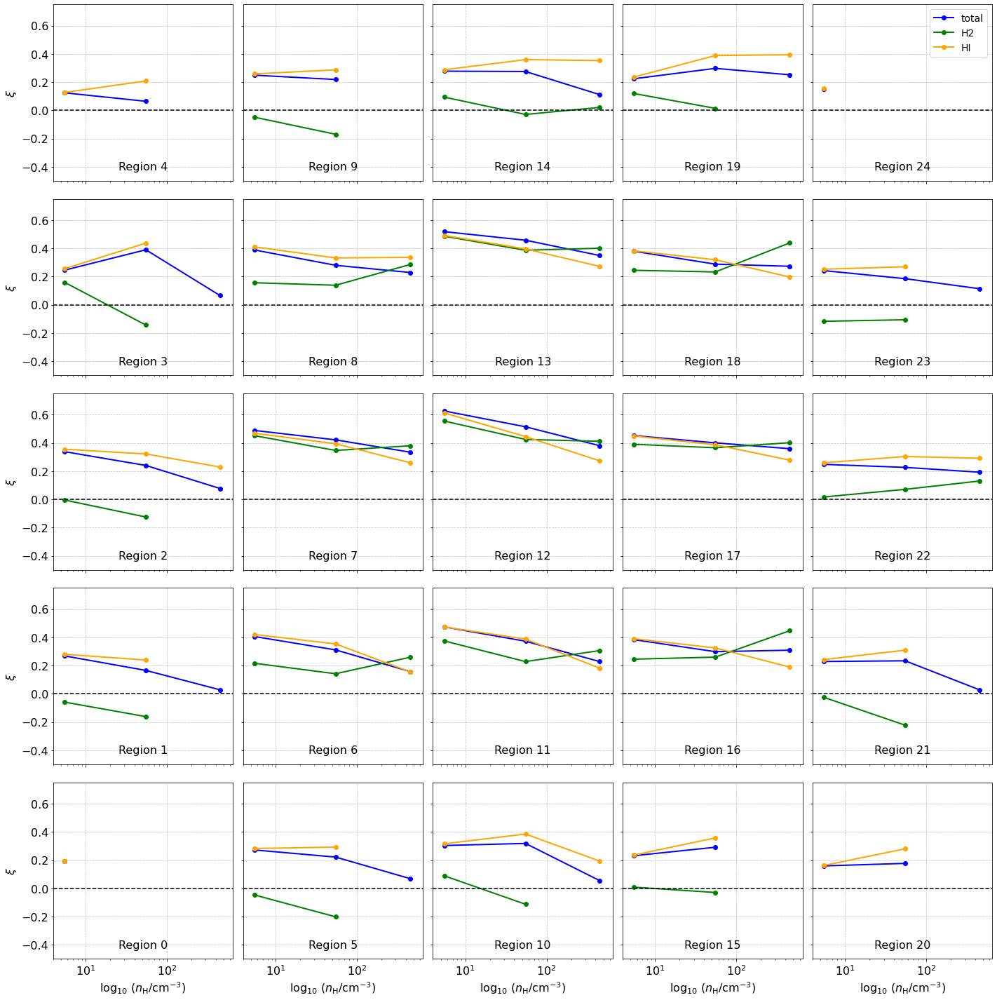

In [45]:
########## plot all HRO xi results for all regions ########## 

# Define the indices of the regions you want to plot
region_indices = [4, 9, 14, 19, 24, 3, 8, 13, 18, 23, 2, 7, 12, 17, 22, 1, 6, 11, 16, 21, 0, 5, 10, 15, 20]  # Change the indices as needed

# Define the figure and subplots
fig, axs = plt.subplots(5, 5, figsize=(20, 20))  # 5 rows, 5 columns

# Loop over each region index
for i, region_index in enumerate(region_indices):
    # Calculate the row and column indices for the current subplot
    row_index = i // 5
    col_index = i % 5
    
    # Get xi values for the current region
    xi_values =  filtered_total_xi[region_index]
    #Hp_xi_values = filtered_Hp_xi[region_index]
    H2_xi_values = filtered_H2_xi[region_index]
    HI_xi_values = filtered_HI_xi[region_index]
    
    # Get cdens values
    cdens = total_outputs_dict['Total_cdens'][region_index]
    #Hp_cdens = Hp_outputs_dict['Hp_cdens'][region_index] 
    H2_cdens = H2_outputs_dict['H2_cdens'][region_index] 
    HI_cdens = HI_outputs_dict['HI_cdens'][region_index]   
    
    # Plot for the current region with specified line colors
    axs[row_index, col_index].semilogx(cdens, xi_values, 'o-', linewidth=2, color='blue', label='total') 
    #axs[row_index, col_index].semilogx(Hp_cdens, Hp_xi_values, 'o-', linewidth=2, color='purple', label='Hp')  
    axs[row_index, col_index].semilogx(H2_cdens, H2_xi_values, 'o-', linewidth=2, color='green', label='H2')  
    axs[row_index, col_index].semilogx(HI_cdens, HI_xi_values, 'o-', linewidth=2, color='orange', label='HI')
    
    axs[row_index, col_index].axhline(y=0., c='k', ls='--')  
    axs[row_index, col_index].set_xlabel(r'log$_{10}$ ($n_{\rm H}/$cm$^{-3}$)', fontsize=16)
    axs[row_index, col_index].set_ylabel(r'$\xi$', fontsize=16)
    axs[row_index, col_index].grid(linestyle='--', alpha=0.7)
    axs[row_index, col_index].tick_params(labelsize=16)
    axs[row_index, col_index].set_ylim(-0.5, 0.75)
    axs[row_index, col_index].set_xlim(4, 650)
    
    # Add text label at the bottom center
    axs[row_index, col_index].text(0.5, 0.05, f'Region {region_index}', transform=axs[row_index, col_index].transAxes, ha='center', va='bottom', fontsize=16)

# Add legend to the top right plot (region 15)
axs[0, 4].legend(fontsize=14, loc='best')

# Remove unnecessary x-axis labels and ticks except for the bottom row
for ax in axs[:-1, :].flat:
    ax.set_xticklabels([''] * len(ax.get_xticks()))  # Remove tick labels
    ax.set_xlabel('')
    ax.tick_params(axis='x', which='both', bottom=True, top=False)  # Keep tick markers
    
# Remove unnecessary y-axis labels and ticks except for the leftmost column
for ax in axs[:, 1:].flat:
    ax.set_yticklabels([''] * len(ax.get_yticks()))  # Remove tick labels
    ax.set_ylabel('')
    ax.tick_params(axis='y', which='both', left=True, right=False)  # Keep tick markers

# Adjust layout
plt.tight_layout()

if save_plots == True:
    plt.savefig(save_base + 'all_filtered_hro_xi.png', bbox_inches='tight', facecolor='white', edgecolor='white', dpi=300)

# Show the plot
plt.show()

## Make some scatter plots ##

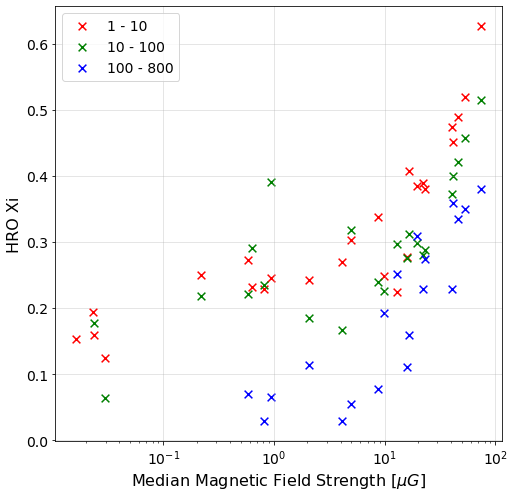

In [46]:
#### magnetic field vs Xi ####

# Plot the filtered data
plt.figure(figsize=(8, 8))

plt.scatter(filter_1_10['Median Magnetic Field Strength [$\mu G$]'].values, filter_1_10['HRO Xi 1 - 10 (Total)'].values, c='r', marker='x', s=60, label='1 - 10')
plt.scatter(filter_10_100['Median Magnetic Field Strength [$\mu G$]'].values, filter_10_100['HRO Xi 10 - 100 (Total)'].values, c='g', marker='x', s=60, label='10 - 100')
plt.scatter(filter_100_800['Median Magnetic Field Strength [$\mu G$]'].values, filter_100_800['HRO Xi 100 - 800 (Total)'].values, c='b', marker='x', s=60, label='100 - 800')

plt.xlabel('Median Magnetic Field Strength [$\mu G$]', fontsize=16)
plt.ylabel('HRO Xi', fontsize=16)
plt.legend(fontsize=14)
plt.xscale('log')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.grid(alpha=0.4)

if save_plots == True:
    plt.savefig(save_base + 'total_xi_b_relation.png', bbox_inches='tight', facecolor='white', edgecolor='white', dpi=300)

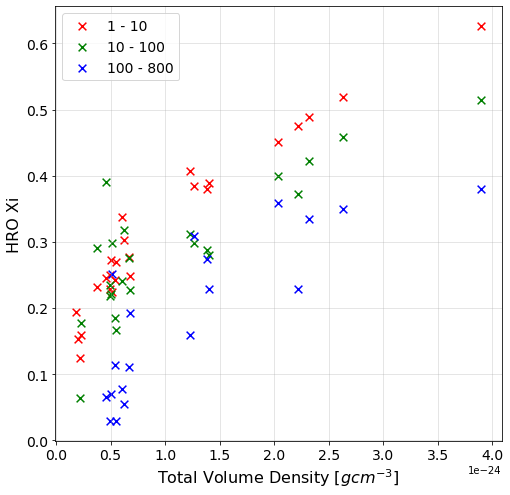

In [47]:
plt.figure(figsize=(8, 8))

plt.scatter(filter_1_10['Total Volume Density [$gcm^{-3}$]'].values, filter_1_10['HRO Xi 1 - 10 (Total)'].values, c='r', marker='x', s=60, label='1 - 10')
plt.scatter(filter_10_100['Total Volume Density [$gcm^{-3}$]'].values, filter_10_100['HRO Xi 10 - 100 (Total)'].values, c='g', marker='x', s=60, label='10 - 100')
plt.scatter(filter_100_800['Total Volume Density [$gcm^{-3}$]'].values, filter_100_800['HRO Xi 100 - 800 (Total)'].values, c='b', marker='x', s=60, label='100 - 800')

plt.xlabel('Total Volume Density [$gcm^{-3}$]', fontsize=16)
plt.ylabel('HRO Xi', fontsize=16)
plt.legend(fontsize=14)
#plt.xscale('log')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.grid(alpha=0.4)

if save_plots == True:
    plt.savefig(save_base + 'total_xi_vol_dens_relation.png', bbox_inches='tight', facecolor='white', edgecolor='white', dpi=300)

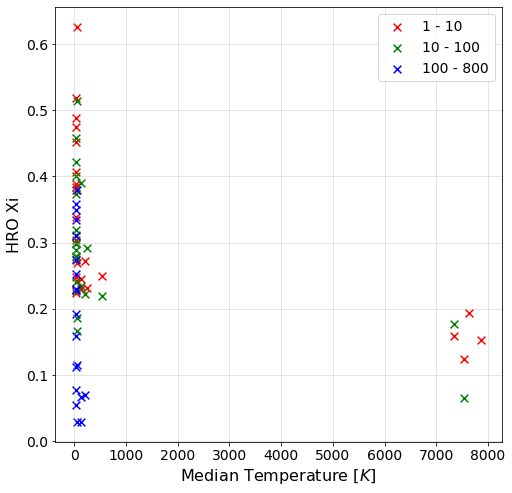

In [48]:
plt.figure(figsize=(8, 8))

plt.scatter(filter_1_10['Median Temperature [$K$]'].values, filter_1_10['HRO Xi 1 - 10 (Total)'].values,  c='r', marker='x', s=60, label='1 - 10')
plt.scatter(filter_10_100['Median Temperature [$K$]'].values, filter_10_100['HRO Xi 10 - 100 (Total)'].values, c='g', marker='x', s=60, label='10 - 100')
plt.scatter(filter_100_800['Median Temperature [$K$]'].values, filter_100_800['HRO Xi 100 - 800 (Total)'].values, c='b', marker='x', s=60, label='100 - 800')

plt.xlabel('Median Temperature [$K$]', fontsize=16)
#plt.xlim(0,600)
plt.ylabel('HRO Xi', fontsize=16)
plt.legend(fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.grid(alpha=0.4)

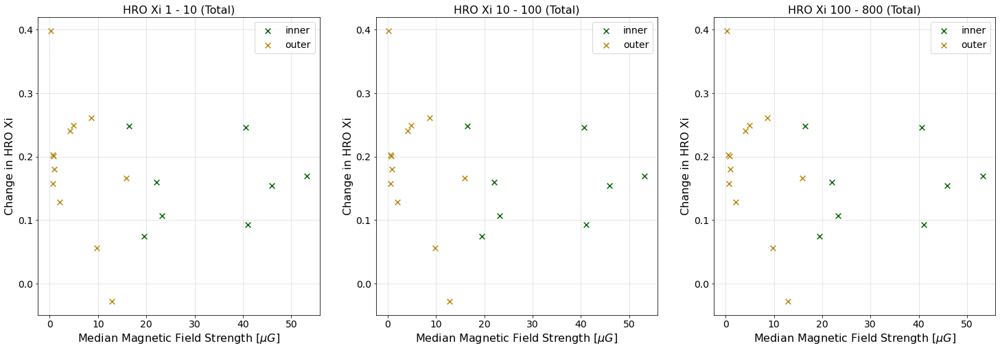

In [48]:
# Change in Xi for inner vs outer

########## ########## ##########

# Rows for 'inner galaxy'
inner_indices = [6, 7, 8, 11, 13, 16, 17, 18]

# Extracting for inner galaxy
inner_hro_1_10 = catalogue_df.loc[inner_indices, 'HRO Xi 1 - 10 (Total)'].values
inner_hro_100_800 = catalogue_df.loc[inner_indices, 'HRO Xi 100 - 800 (Total)'].values

inner_hro_diff = inner_hro_1_10 - inner_hro_100_800

inner_magnetic_field = catalogue_df.loc[inner_indices, 'Median Magnetic Field Strength [$\mu G$]'].values

########## ########## ##########
# Rows for 'outer galaxy'
outer_indices = [1, 2, 3, 5, 9, 10, 14, 15, 19, 21, 22, 23]

# Extracting for outer galaxy
outer_hro_1_10 = catalogue_df.loc[outer_indices, 'HRO Xi 1 - 10 (Total)'].values
outer_hro_100_800 = catalogue_df.loc[outer_indices, 'HRO Xi 100 - 800 (Total)'].values

outer_hro_diff = outer_hro_1_10 - outer_hro_100_800

outer_magnetic_field = catalogue_df.loc[outer_indices, 'Median Magnetic Field Strength [$\mu G$]'].values

########## ########## ##########

# Create a figure with two rows and three columns of subplots
fig, axs = plt.subplots(1, 3, figsize=(25, 8))

axs[0].scatter(inner_magnetic_field, inner_hro_diff, c='darkgreen', marker='x', s=60, label='inner')
axs[0].scatter(outer_magnetic_field, outer_hro_diff, c='darkgoldenrod', marker='x', s=60, label='outer')


axs[0].set_title('HRO Xi 1 - 10 (Total)', fontsize=16)
axs[0].set_xlabel('Median Magnetic Field Strength [$\mu G$]', fontsize=16)
axs[0].set_ylabel('Change in HRO Xi', fontsize=16)
axs[0].legend(fontsize=14)
axs[0].tick_params(labelsize=14)
axs[0].grid(alpha=0.4)

axs[1].scatter(inner_magnetic_field, inner_hro_diff, c='darkgreen', marker='x', s=60, label='inner')
axs[1].scatter(outer_magnetic_field,  outer_hro_diff, c='darkgoldenrod', marker='x', s=60, label='outer')

axs[1].set_title('HRO Xi 10 - 100 (Total)', fontsize=16)
axs[1].set_xlabel('Median Magnetic Field Strength [$\mu G$]', fontsize=16)
axs[1].set_ylabel('Change in HRO Xi', fontsize=16)
axs[1].legend(fontsize=14)
axs[1].tick_params(labelsize=14)
axs[1].grid(alpha=0.4)

axs[2].scatter(inner_magnetic_field, inner_hro_diff, c='darkgreen', marker='x', s=60, label='inner')
axs[2].scatter(outer_magnetic_field, outer_hro_diff, c='darkgoldenrod', marker='x', s=60, label='outer')

axs[2].set_title('HRO Xi 100 - 800 (Total)', fontsize=16)
axs[2].set_xlabel('Median Magnetic Field Strength [$\mu G$]', fontsize=16)
axs[2].set_ylabel('Change in HRO Xi', fontsize=16)
axs[2].legend(fontsize=14)
axs[2].tick_params(labelsize=14)
axs[2].grid(alpha=0.4)

# Bonus Plots #

### 4 Panel Single Tile Density and Field Lines, All Species ###

In [ ]:
slice_index = 500

# Plotting settings
extent = (tile_x[0], tile_x[1], tile_y[0], tile_y[1])

# Define levels for each plot
levels_dens = np.logspace(-1, 3, 256)
levels_H2_dens = np.logspace(-3, 2, 256)
levels_Hp_dens = np.logspace(-3, 0, 256)
levels_HI_dens = np.logspace(-1, 2, 256)

ticks_dens = [1e-1, 1e0, 1e1, 1e2, 1e3]
ticks_H2_dens = [1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2]
ticks_Hp_dens = [1e-3, 1e-2, 1e-1, 1e0]
ticks_HI_dens = [1e-1, 1e0, 1e1, 1e2]

norm_dens = mc.BoundaryNorm(levels_dens, 256)
norm_H2_dens = mc.BoundaryNorm(levels_H2_dens, 256)
norm_Hp_dens = mc.BoundaryNorm(levels_Hp_dens, 256)
norm_HI_dens = mc.BoundaryNorm(levels_HI_dens, 256)

levels_mag = np.logspace(-2, 2, 256)
norm_mag = mc.BoundaryNorm(levels_mag, 256)

B_field = magnetic_grid[:,:,slice_index,:]

mesh_x = np.linspace(tile_x[0],tile_x[1], 1000)
mesh_y = np.linspace(tile_y[0],tile_y[1], 1000)
mesh_X, mesh_Y = np.meshgrid(mesh_x, mesh_y)

U = (B_field[:,:,0] * umag * 1e6).T
V = (B_field[:,:,1] * umag * 1e6).T

# Create 2x2 grid of subplots
fig, axes = plt.subplots(2, 2, figsize=(20, 20))
fig.subplots_adjust(right=0.9, wspace=0.3, hspace=0)

# Plotting function
def plot_number_density_with_streamlines(ax, data, norm, cmap, label, ticks):
    ax.set_aspect(1)
    ax.streamplot(mesh_X, mesh_Y, U, V, density=2, linewidth=1, color='k')
    im = ax.imshow(data[:, :, slice_index].T, origin='lower', norm=norm, cmap=cmap, extent=extent)
    cbar = plt.colorbar(im, ax=ax, ticks=ticks, format='%.0e', fraction=0.046, pad=0.04)
    cbar.set_label(label, size=14)
    cbar.ax.tick_params(labelsize=14)

# Plot each surface density with streamlines
plot_number_density_with_streamlines(axes[0, 0], yn_grid, norm_dens, 'OrRd', 'Total Gas Number Density', ticks_dens)
plot_number_density_with_streamlines(axes[0, 1], Hp_grid, norm_Hp_dens, 'BuPu', 'Hp Number Density', ticks_Hp_dens)
plot_number_density_with_streamlines(axes[1, 0], H2_grid, norm_H2_dens, 'YlGn', 'H2 Number Density', ticks_H2_dens)
plot_number_density_with_streamlines(axes[1, 1], HI_grid, norm_HI_dens, 'YlOrBr', 'HI Number Density', ticks_HI_dens)

# Adjust labels and ticks
for i, ax in enumerate(axes.flat):
    if i < 2:
        ax.set_xlabel('')
    if i % 2 == 1:
        ax.set_ylabel('')
    ax.tick_params(axis='x', labelsize=16)
    ax.tick_params(axis='y', labelsize=16)

axes[1, 0].set_xlabel('x [kpc]', fontsize=18)
axes[1, 1].set_xlabel('x [kpc]', fontsize=18)
axes[0, 0].set_ylabel('y [kpc]', fontsize=18)
axes[1, 0].set_ylabel('y [kpc]', fontsize=18)

plt.show()

## Old Low-Res Method Of Plotting Full Density Slice With Streamlines ##

In [ ]:
#########################################         SURFACE DENSITY PLOT WITH STREAMLINES       ############################################

extent = (-10,10,-10,10)

### B field ###

B_field = rsnap.read_vector_image(snap_base + 'magnetic_proj_' + filenum)

mesh_x = np.linspace(-10,10, 1000)
mesh_y = np.linspace(-10,10, 1000)
mesh_X, mesh_Y = np.meshgrid(mesh_x, mesh_y)

U =  (B_field[:,:,0] * umag * 1e6).T
V =  (B_field[:,:,1] * umag * 1e6).T

fig, ax = plt.subplots()

#make the images bigger
fig_size = plt.rcParams["figure.figsize"]
fig_size[0]=20
fig_size[1]=20
plt.rcParams["figure.figsize"] = fig_size

ax.set_xlabel('x [kpc]',fontsize=24)
ax.set_ylabel('y [kpc]',fontsize=24)

ax.set_aspect(1)
ax.streamplot(mesh_X, mesh_Y, U, V, density=6, linewidth=1, color='k') #this is the line that creates the field lines changing the density will give you more or less lines, the higher the number the more lines there are, and the longer it will take to plot

### Density ###

#sets the levels for the column density image
levels=np.logspace(20,23,256)
norm=mc.BoundaryNorm(levels,256)
    
im=ax.imshow(Ndensity,cmap='Reds',norm=norm,extent=extent,origin='lower')
#ax.set_title('Surface density [cm$^{-2}$]',fontsize=14)
ax.set_xlabel('x [kpc]',fontsize=20)
ax.set_ylabel('y [kpc]',fontsize=20)
ax.set_aspect(1)

plt.xlim(-5,5)
plt.ylim(-5,5)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

textlabel='T = '+ str(round(time*uMyr,2)) +' Myr'
ax.text(-4.5,4.5,textlabel,fontsize=20,  bbox=dict(facecolor='white', alpha=0.7))

# Move the image to the right so that we can add a colourbar to the left
fig.subplots_adjust(right=0.9)
fig.subplots_adjust(wspace=0.0,hspace=0.0)
cbar_ax = fig.add_axes([0.95, 0.1, 0.02, 0.8])
cbar = plt.colorbar(im,cax=cbar_ax,ticks=[1e+20,1e+21,1e+22,1e+23],format='%.0e')
cbar.set_label('Column Density [$cm^{-2}$]', size = 16)
cbar.ax.tick_params(labelsize=16)

# Add vertical lines to show tile boundaries
for i in range(-5, 5, 2):
    ax.axvline(i , color='k', linestyle=':', linewidth=2, alpha=0.6)

# Add horizontal lines to show tile boundaries
for j in range(-5, 5, 2):
    ax.axhline(j , color='k', linestyle=':', linewidth=2, alpha=0.6)

#plt.savefig('/cosma8/data/dp058/dc-bogu1/MHD_SIMS/TEMP_ZOOM_MAKER/SMALL_SINK_NO_T/sdens_SMALLS.png', bbox_inches='tight')

plt.grid(b=True, which='major', axis='both')
plt.show()

### Tests For Plotting A Specific Set Of Tiles ###

In [ ]:
index_of_region1 = 5
index_of_region2 = 6

In [ ]:
if load_all_grids == True:
    region1_yn_grid = total_yn_grids_cut[index_of_region1][:, :, 250]
    region1_mag_grid = magnetic_grids_cut[index_of_region1][:, :, 250, :]

    region2_yn_grid = total_yn_grids_cut[index_of_region2][:, :, 250]
    region2_mag_grid = magnetic_grids_cut[index_of_region2][:, :, 250, :]

In [ ]:
if load_all_grids == True:
    # Combine the density grids and magnetic field grids of the two regions
    combined_yn_grid = np.concatenate((region1_yn_grid, region2_yn_grid), axis=1)
    combined_mag_grid = np.concatenate((region1_mag_grid, region2_mag_grid), axis=1)

    # Plotting settings
    extent = (-3, -1, -5, -1)  # Double the y extent
    levels_dens = np.logspace(-1, 3, 256)
    levels_mag = np.logspace(-2, 2, 256)
    norm_dens = mc.BoundaryNorm(levels_dens, 256)
    norm_mag = mc.BoundaryNorm(levels_mag, 256)

    # Plot the combined density and magnetic field
    fig, ax = plt.subplots()

    mesh_x = np.linspace(-3, -1, 1000)
    mesh_y = np.linspace(-5, -1, 2000)  # Double the number of y points
    mesh_X, mesh_Y = np.meshgrid(mesh_x, mesh_y)

    U_combined = (combined_mag_grid[:, :, 0] * umag * 1e6).T
    V_combined = (combined_mag_grid[:, :, 1] * umag * 1e6).T

    ax.streamplot(mesh_X, mesh_Y, U_combined, V_combined, density=2, linewidth=1, color='k', cmap='Greys')
    im_combined = ax.imshow(combined_yn_grid.T, origin='lower', norm=norm_dens, cmap='OrRd', extent=extent)

    # Additional settings for the combined plot
    ax.set_xlabel('x [kpc]', fontsize=20)
    ax.set_ylabel('y [kpc]', fontsize=20)
    ax.tick_params(axis='x', labelsize=18)
    ax.tick_params(axis='y', labelsize=18)

    # Add colorbar
    cbar_combined = plt.colorbar(im_combined, ax=ax, ticks=[1e-1, 1e0, 1e1, 1e2, 1e3], format='%.0e')
    cbar_combined.set_label('Number Density', size=16)
    cbar_combined.ax.tick_params(labelsize=16)

    plt.grid(b=True, which='major', axis='both')
    plt.show()